In [1]:
import os
import pandas as pd
from pandas import json_normalize
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

In [2]:
# Function to read data from text (CSV) files
def read_data(file_name):
    df = pd.read_csv(file_name, names=['data_id', 'accel0X', 'accel0Y', 'accel0Z', 'accel1X', 'accel1Y', 'accel1Z', 'tension', 'timestamp'], dtype=str)
    df['time'] = pd.to_datetime(df['timestamp'], unit='ms')
    df[['accel0X', 'accel0Y', 'accel0Z', 'accel1X', 'accel1Y', 'accel1Z', 'tension']] = df[['accel0X', 'accel0Y', 'accel0Z', 'accel1X', 'accel1Y', 'accel1Z', 'tension']].apply(pd.to_numeric, errors='coerce')
    df['tension'] = 0.650 * (df['tension'] - 2166)
    return df

def establish_printing_start(file_name):
    df = pd.read_json(file_name, lines=True)
    df = json_normalize(df.to_dict('records'))
    return df[df.status == 'P'].head(1)['timestamp'].values[0]

# Add Label Encoder
label_encoder = LabelEncoder()

def process_and_label_data(base_dir):
    categories = ['arm_failure', 'bowden', 'plastic', 'proper', 'retraction_05', 'unstick']
    all_data = []

    for category in categories:
        print(f"Processing category: {category}")
        txt_file = os.path.join(base_dir, category, 't.txt')
        json_file = os.path.join(base_dir, category, 'j.json')

        df = read_data(txt_file)
        start_time = establish_printing_start(json_file)
        df = df[df.time > start_time]
        
        # Add category label
        df['label'] = category

        all_data.append(df)

    combined_df = pd.concat(all_data, ignore_index=True)
    return combined_df

def zscore_normalize_data(df, columns):
    for column in columns:
        df[column] = df[column].astype(float)
        mean = df[column].mean()
        std = df[column].std()
        df[column] = (df[column] - mean) / std
    return df

def minmax_normalize_data(df, columns):
    scaler = MinMaxScaler()
    df[columns] = scaler.fit_transform(df[columns])
    return df

# Function to plot raw data
def plot_raw_data(df, features, categories):
    for category in categories:
        category_data = df[df['label'] == category]
        category_data_interpolated = category_data.copy().interpolate(method='linear')
        for feature in features:
            plt.figure(figsize=(15, 5))

            # Plot raw and interpolated data together
            plt.plot(category_data['time'], category_data[feature], label='Raw Data', alpha=0.6)
            plt.plot(category_data_interpolated['time'], category_data_interpolated[feature], label='Interpolated Data', alpha=0.6)
            plt.title(f'Raw vs Interpolated Data for Category: {category}, Feature: {feature}')
            plt.xlabel('Time')
            plt.ylabel('Value')
            plt.legend()
            plt.show()


# Function to plot raw data
def plot_Normalized_data(df, features, categories):
    for category in categories:
        category_data = df[df['label'] == category]
        for feature in features:
            plt.figure(figsize=(15, 5))
            plt.plot(category_data['time'], category_data[feature])
            plt.title(f'Normalized Data for Category: {category}, Feature: {feature}')
            plt.xlabel('Time')
            plt.ylabel('Value')
            plt.show()

In [3]:
# Call the function to process and label the data
base_directory = r'C:\MyFiles\AI\UNI\ML-DP-AI\Project\dataset\WithBase'
all_data = process_and_label_data(base_directory)

# Handle missing values using interpolation
all_data_int = all_data.interpolate(method='linear')

Raw_data = all_data_int.copy()

categories = ['arm_failure', 'bowden', 'plastic', 'proper', 'retraction_05', 'unstick']
features = ['accel0X', 'accel0Y', 'accel0Z', 'accel1X', 'accel1Y', 'accel1Z', 'tension']

Processing category: arm_failure


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2208005594.py:4: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: bowden


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2208005594.py:4: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: plastic


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2208005594.py:4: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: proper


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2208005594.py:4: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: retraction_05


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2208005594.py:4: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: unstick


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2208005594.py:4: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')
C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2784722941.py:6: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  all_data_int = all_data.interpolate(method='linear')


In [5]:
def window_rms(a, window_size):
    a2 = np.power(a, 2)
    window = np.ones(window_size) / float(window_size)
    rms = np.sqrt(np.convolve(a2, window, 'valid'))
    # Pad the result to match the original length
    pad_length = len(a) - len(rms)
    return np.pad(rms, (pad_length // 2, pad_length - pad_length // 2), 'edge')

# Apply the window_rms function to each feature
def apply_window_rms(df, features, window_size):
    for feature in features:
        df[feature] = window_rms(df[feature].values, window_size)
    return df
    
window_size = 50000

# Create a deep copy to apply RMS
RMS_data = all_data_int.copy()
RMS_data = apply_window_rms(RMS_data, features, window_size)



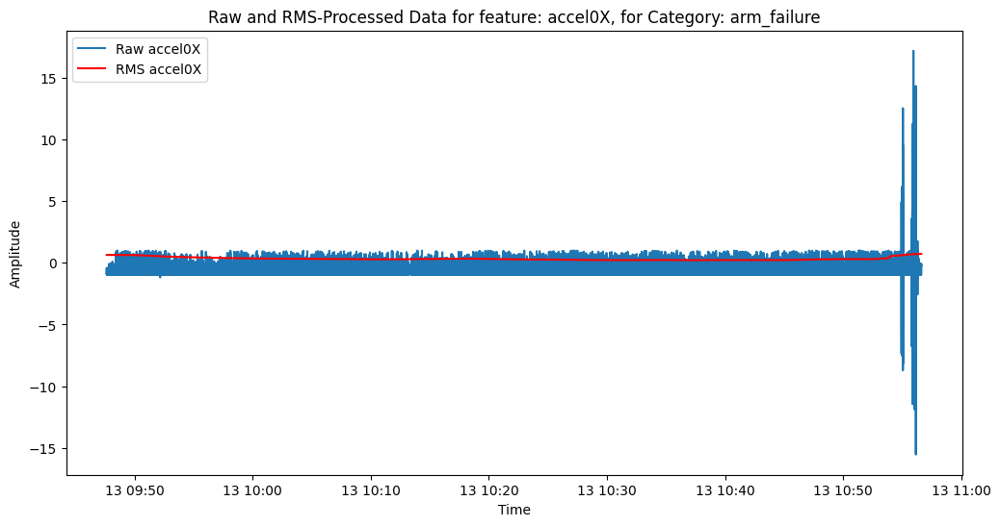

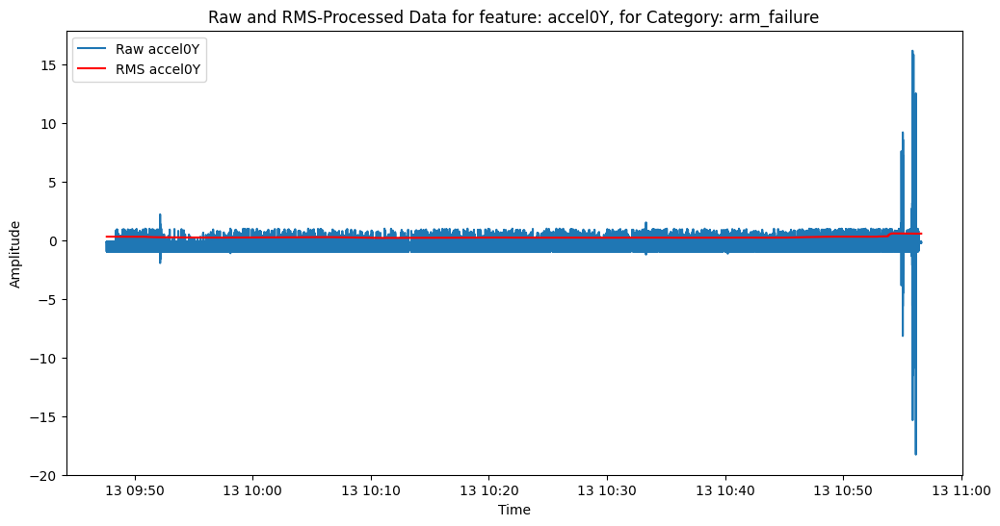

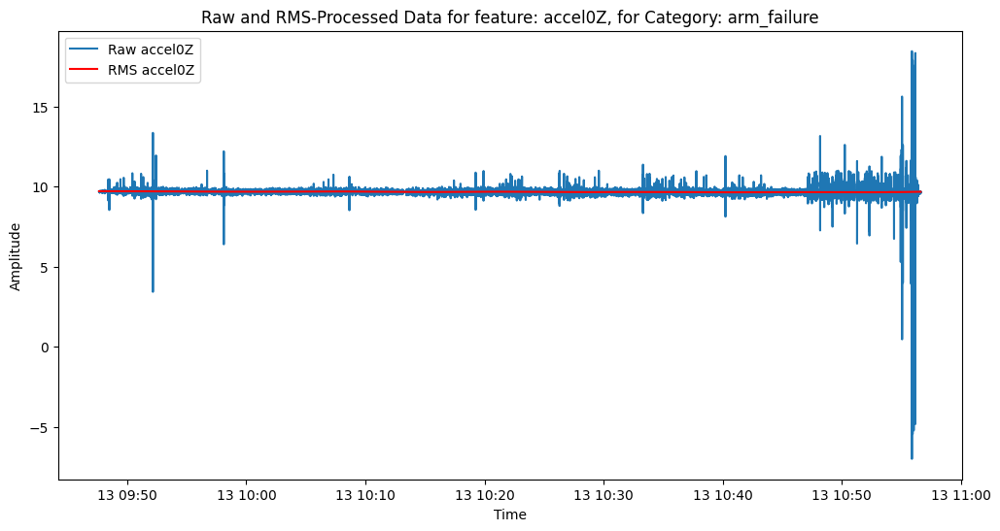

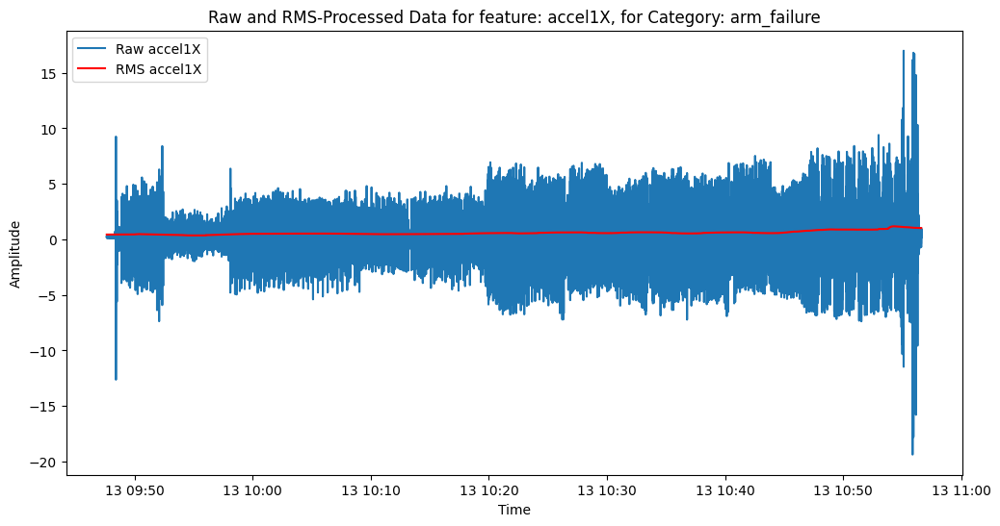

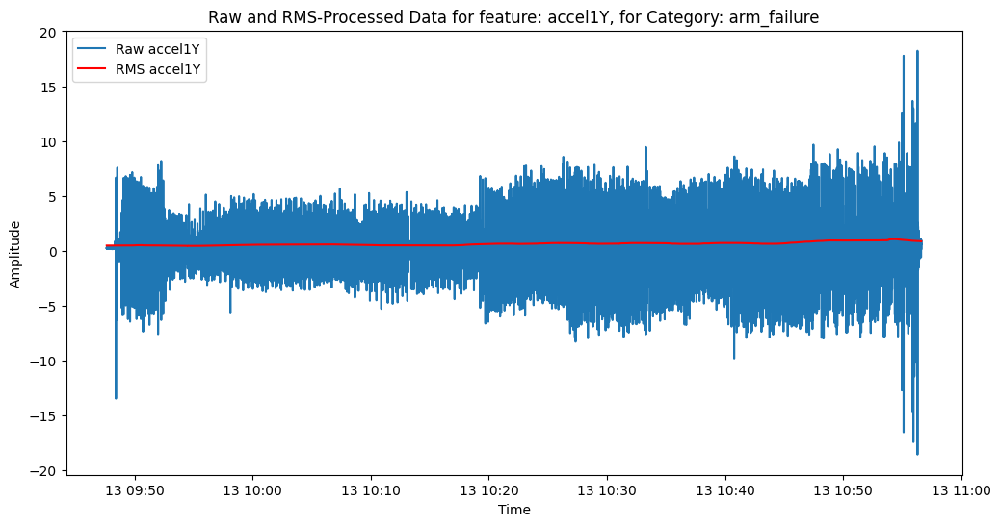

...

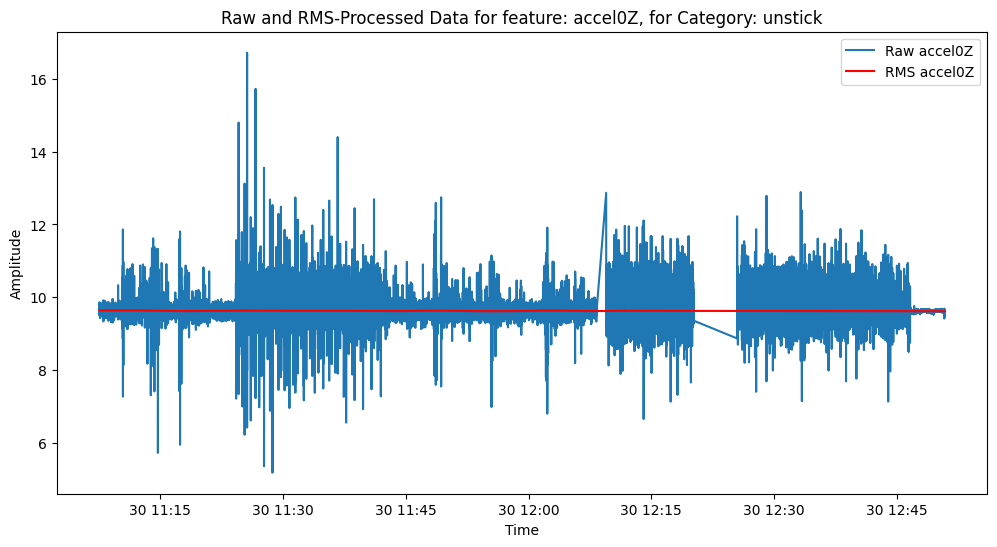

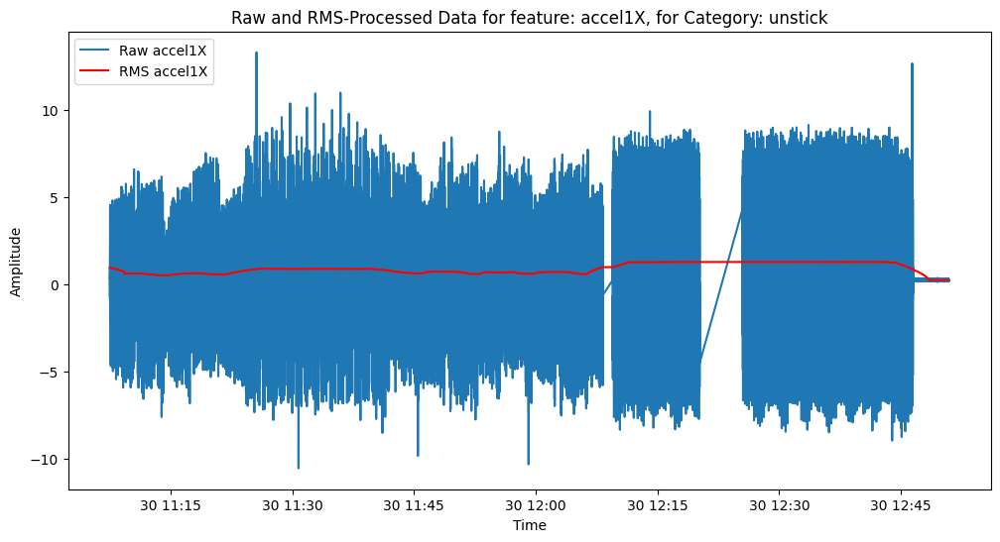

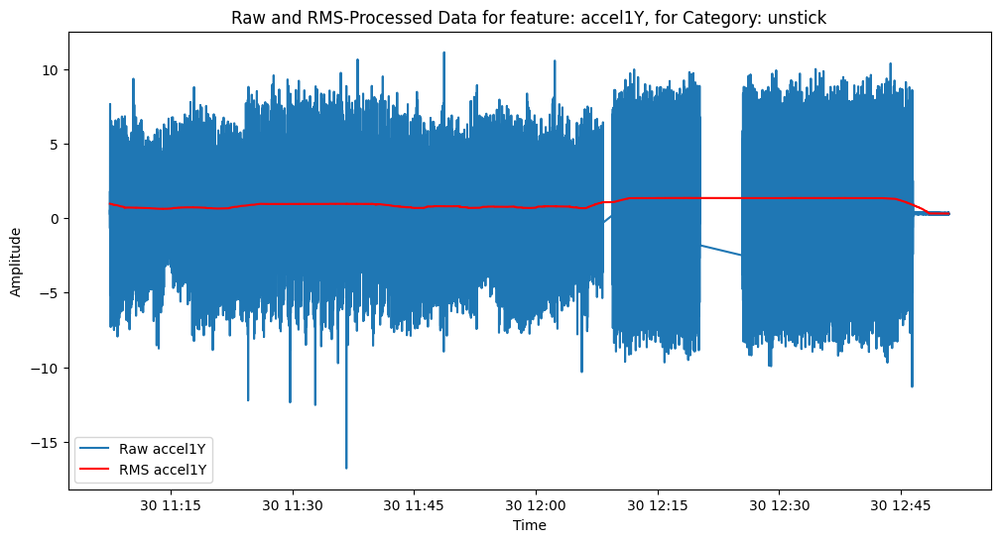

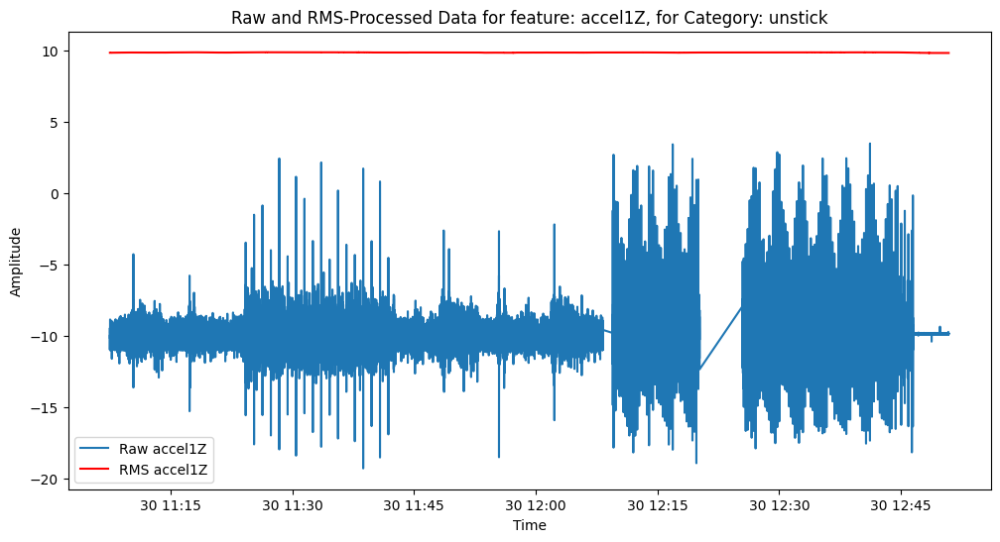

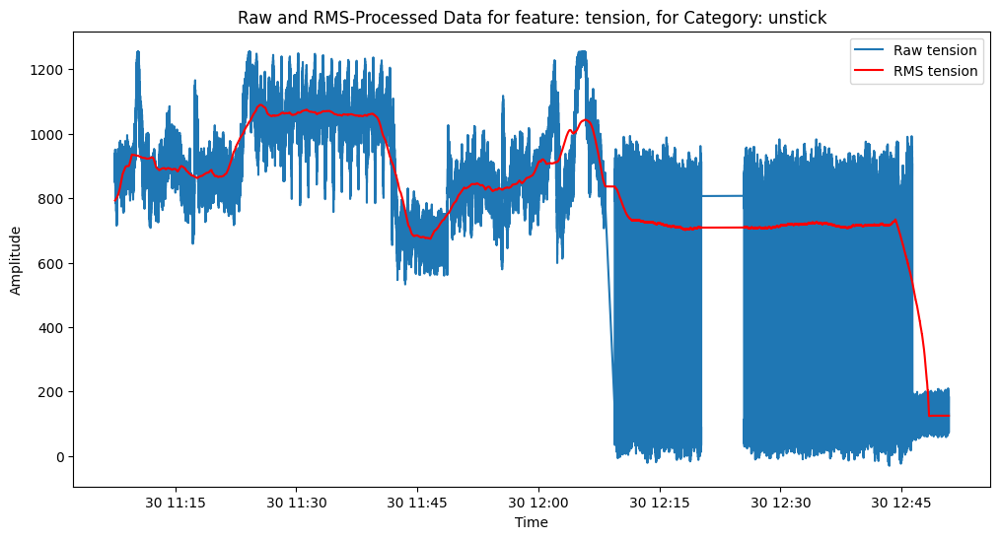

In [6]:
for category in categories:
    category_data_raw = Raw_data[Raw_data['label'] == category]
    category_data_rms = RMS_data[RMS_data['label'] == category]
    for feature in features:
        plt.figure(figsize=(12, 6))
        plt.plot(category_data_raw['time'], category_data_raw[feature].values, label=f'Raw {feature}')
        plt.plot(category_data_rms['time'], category_data_rms[feature].values, label=f'RMS {feature}', color='red')
        plt.xlabel('Time')
        plt.ylabel('Amplitude')
        plt.title(f'Raw and RMS-Processed Data for feature: {feature}, for Category: {category}')
        plt.legend()
        plt.show()

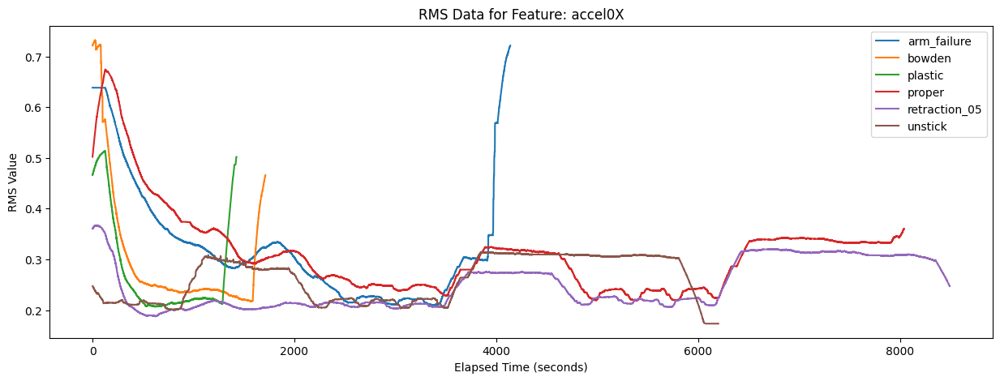

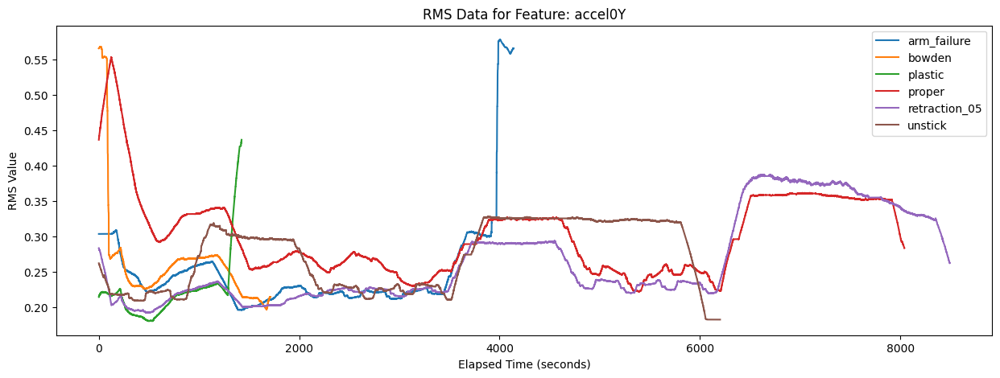

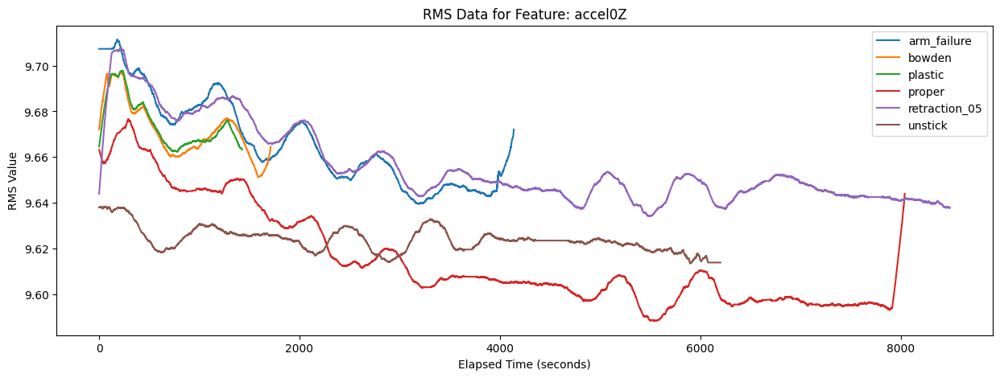

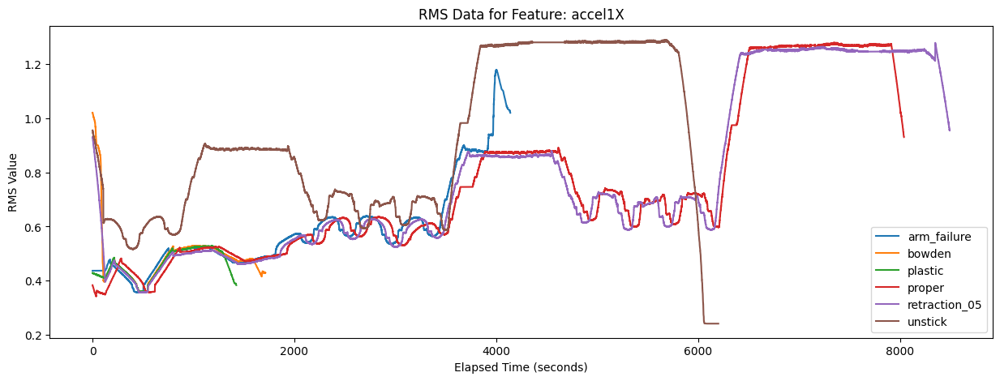

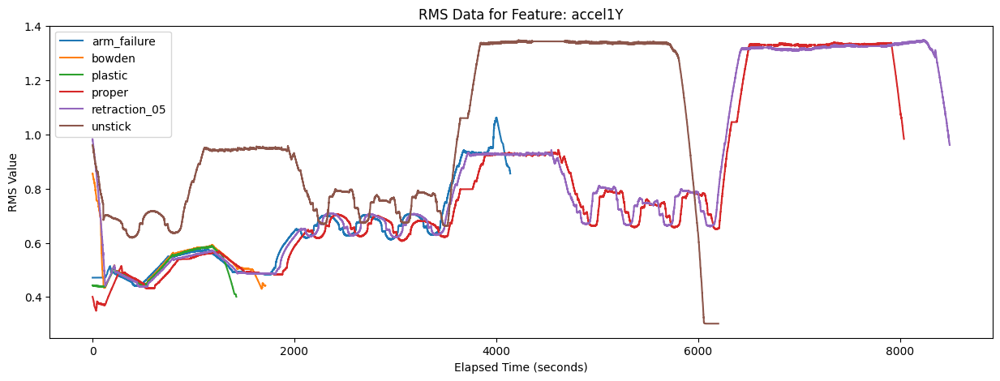

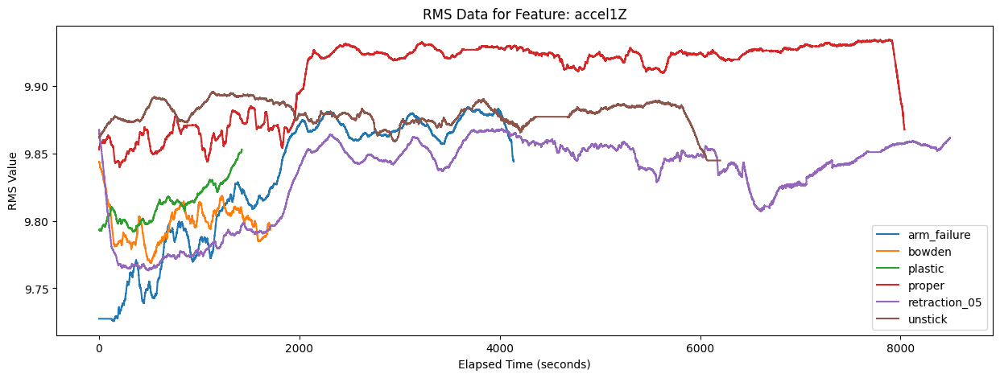

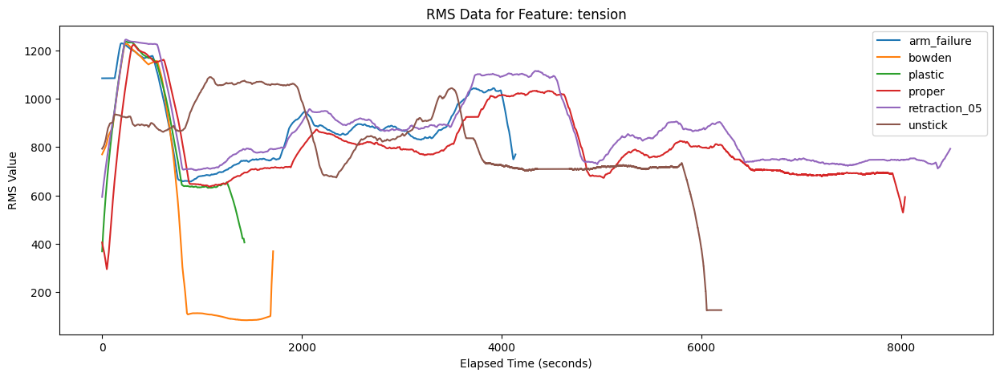

In [7]:

# Function to convert timestamp to elapsed time in seconds for each category
def convert_to_elapsed_time_per_category(df, categories):
    df_list = []
    for category in categories:
        category_data = df[df['label'] == category].copy()
        category_data['elapsed_time'] = (category_data['time'] - category_data['time'].min()).dt.total_seconds()
        df_list.append(category_data)
    return pd.concat(df_list, ignore_index=True)

# Update RMS plotting function to use elapsed time starting from zero
def plot_RMS_data(df, features, categories):
    for feature in features:
        plt.figure(figsize=(15, 5))
        for category in categories:
            category_data = df[df['label'] == category]
            # Plot the feature for the given category using elapsed time
            plt.plot(category_data['elapsed_time'], category_data[feature], label=f'{category}')
        
        plt.title(f'RMS Data for Feature: {feature}')
        plt.xlabel('Elapsed Time (seconds)')
        plt.ylabel('RMS Value')
        plt.legend(loc='best')
        plt.show()

# Convert timestamps to elapsed time for each category
RMS_data = convert_to_elapsed_time_per_category(RMS_data, categories)

# Plot the RMS data to compare categories for each feature
plot_RMS_data(RMS_data, features, categories)

In [8]:

# for feature in features:
#     RMS_data[feature] = RMS_data[feature].fillna(RMS_data[feature].mean())
#     RMS_data[feature].replace([np.inf, -np.inf], RMS_data[feature].mean(), inplace=True)
all_data  = RMS_data.copy()
all_data = zscore_normalize_data(all_data, features)


In [9]:
# Reshape data into segments
X = all_data[features].values
y = all_data['label'].values

time_steps = 100
samples = len(X) // time_steps
X = X[:samples*time_steps].reshape(samples, time_steps, len(features))

# Encode categorical labels
y = label_encoder.fit_transform(y)
y = y[:samples*time_steps].reshape(samples, time_steps, -1)
y = np.apply_along_axis(lambda x: np.bincount(x.astype(int)).argmax(), axis=1, arr=y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [10]:
# Define the 1D-CNN model
def create_1d_cnn_model(input_shape, num_classes):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=input_shape))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Create the model
input_shape = (X_train.shape[1], X_train.shape[2])
num_classes = len(np.unique(y))
model = create_1d_cnn_model(input_shape, num_classes)

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model and save the history
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy}')
print(f'Test Loss: {test_loss}')

# Save the model
model.save('1d_cnn_model.h5')

C:\Users\M.lotfi\anaconda3\envs\Myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
1156/1156 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.9296 - loss: 0.2285 - val_accuracy: 0.9983 - val_loss: 0.0058
Epoch 2/100
1156/1156 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.9932 - loss: 0.0286 - val_accuracy: 0.9909 - val_loss: 0.0224
Epoch 3/100
1156/1156 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.9937 - loss: 0.0247 - val_accuracy: 0.9985 - val_loss: 0.0075
Epoch 4/100
1156/1156 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.9973 - loss: 0.0110 - val_accuracy: 0.9953 - val_loss: 0.0084
Epoch 5/100
1156/1156 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - accuracy: 0.9956 - loss: 0.0204 - val_accuracy: 0.9957 - val_loss: 0.0163
Epoch 6/100
1156/1156 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.9975 - loss: 0.0091 - val_accuracy: 0.9989 - val_loss: 0.0030
Epoch 7/100
1156/1156 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.9956 - loss: 0.0168 - val_accuracy: 0.9981 - val_loss: 0.0034
Epoch 8/100
1156/1156 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.9975 - loss: 

Test Accuracy: 0.9994805455207825
Test Loss: 0.0008414535550400615


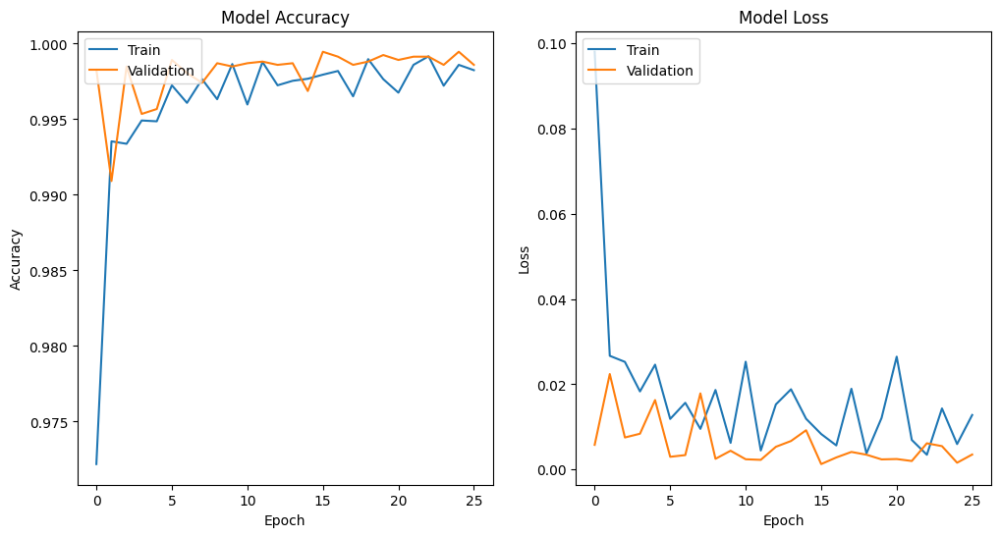

In [11]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

361/361 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Test Accuracy: 0.99948
Classification Report:
               precision    recall  f1-score   support

  arm_failure       1.00      1.00      1.00      1661
       bowden       1.00      1.00      1.00       674
      plastic       1.00      1.00      1.00       559
       proper       1.00      1.00      1.00      2952
retraction_05       1.00      1.00      1.00      3401
      unstick       1.00      1.00      1.00      2304

     accuracy                           1.00     11551
    macro avg       1.00      1.00      1.00     11551
 weighted avg       1.00      1.00      1.00     11551



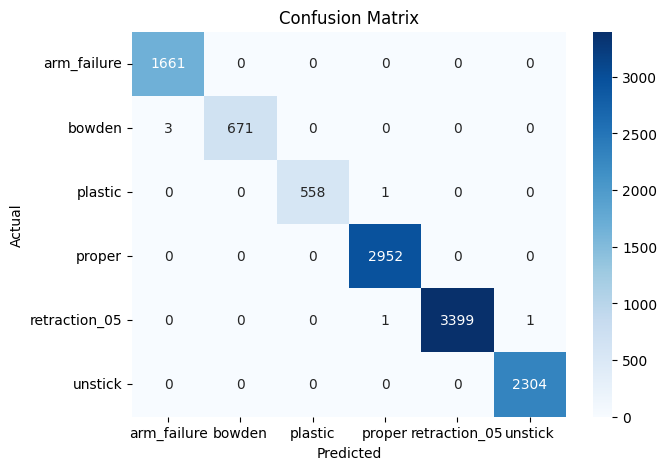

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.keras.models import load_model

# Load the trained model
model = load_model('1d_cnn_model.h5')

# Make predictions on the test data
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Calculate and print the accuracy
accuracy = accuracy_score(y_test, y_pred_classes)
print(f'Test Accuracy: {accuracy:.5f}')

# Generate and print the classification report
report = classification_report(y_test, y_pred_classes, target_names=label_encoder.classes_)
print('Classification Report:')
print(report)

# Generate and plot the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_classes)
plt.figure(figsize=(7, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [13]:
# Test with individual samples from the test set
print(len(X_test))

sample_indices = np.random.choice(len(X_test), 5, replace=False)
X_samples = X_test[sample_indices]
y_true_samples = y_test[sample_indices]
y_pred_samples = model.predict(X_samples)
y_pred_classes_samples = np.argmax(y_pred_samples, axis=1)

for i, idx in enumerate(sample_indices):
    print(f'Sample {idx}:')
    print(f'  True Label: {label_encoder.inverse_transform([y_true_samples[i]])[0]}')
    print(f'  Predicted Label: {label_encoder.inverse_transform([y_pred_classes_samples[i]])[0]}')

11551
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Sample 660:
  True Label: unstick
  Predicted Label: unstick
Sample 1296:
  True Label: proper
  Predicted Label: proper
Sample 9011:
  True Label: retraction_05
  Predicted Label: retraction_05
Sample 235:
  True Label: unstick
  Predicted Label: unstick
Sample 6796:
  True Label: unstick
  Predicted Label: unstick


C:\Users\M.lotfi\anaconda3\envs\Myenv\Lib\site-packages\sklearn\preprocessing\_label.py:153: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\M.lotfi\anaconda3\envs\Myenv\Lib\site-packages\sklearn\preprocessing\_label.py:153: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\M.lotfi\anaconda3\envs\Myenv\Lib\site-packages\sklearn\preprocessing\_label.py:153: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\M.lotfi\anaconda3\envs\Myenv\Lib\site-packages\sklearn\preprocessing\_label.py:153: DataConversionWarning: A column-vector y was passed when a 1d

In [14]:
# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy}')
print(f'Test Loss: {test_loss}')

361/361 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9996 - loss: 5.6687e-04
Test Accuracy: 0.9994805455207825
Test Loss: 0.0008414535550400615


In [15]:
# 50
# Test Accuracy: 0.9225175380706787
# # Test Loss: 0.2320955097675323

In [16]:
# 100
# Test Accuracy: 0.9484027624130249
# Test Loss: 0.14598782360553741

In [17]:
# 200
# Test Accuracy: 0.9101376533508301
# Test Loss: 0.2670440673828125

In [18]:
# 500
# Test Accuracy: 0.9239892363548279
# Test Loss: 0.2005736380815506

In [19]:
# 1000
# Test Accuracy: 0.9642454981803894
# Test Loss: 0.11223413795232773

In [20]:
# 2500
# Test Accuracy: 0.98701411485672
# Test Loss: 0.03831925988197327

In [21]:
# 5000
# Test Accuracy: 0.9941996335983276
# Test Loss: 0.013004668988287449

In [22]:
# 10000
# Test Accuracy: 0.9981819987297058
# Test Loss: 0.00505272438749671

In [23]:
# 20000
# Test Accuracy: 0.9998268485069275
# Test Loss: 0.0012996895238757133

In [24]:
# 50000
# Test Accuracy: 0.9994805455207825
# Test Loss: 0.0015681246295571327

Processing category: arm_failure


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2306740410.py:9: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: bowden


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2306740410.py:9: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: plastic


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2306740410.py:9: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: proper


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2306740410.py:9: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: retraction_05


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2306740410.py:9: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


Processing category: unstick


C:\Users\M.lotfi\AppData\Local\Temp\ipykernel_16276\2306740410.py:9: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df['time'] = pd.to_datetime(df['timestamp'], unit='ms')


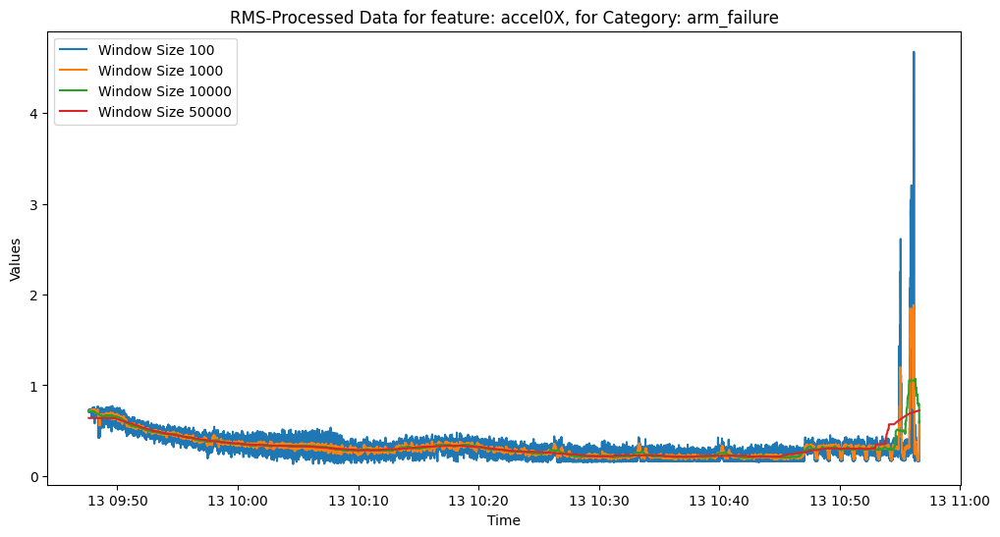

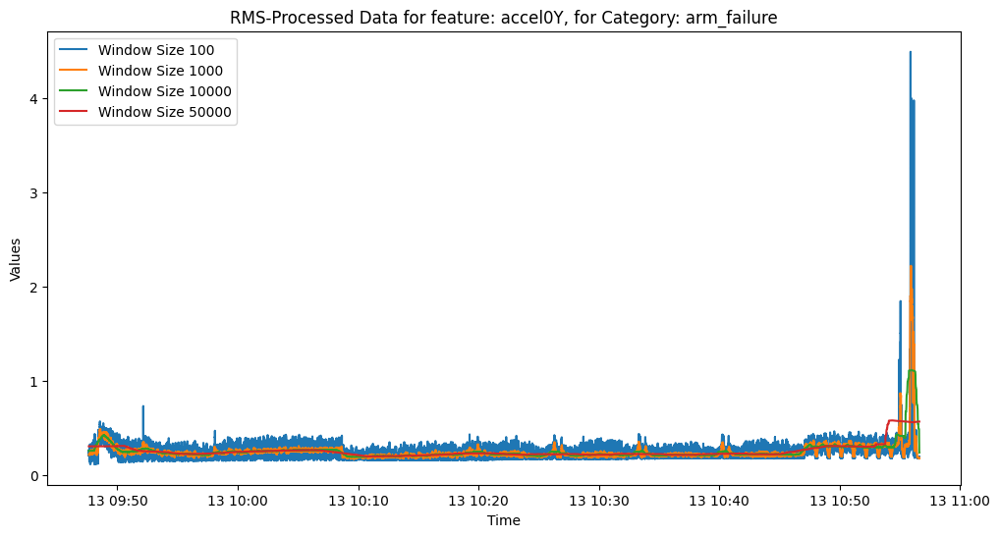

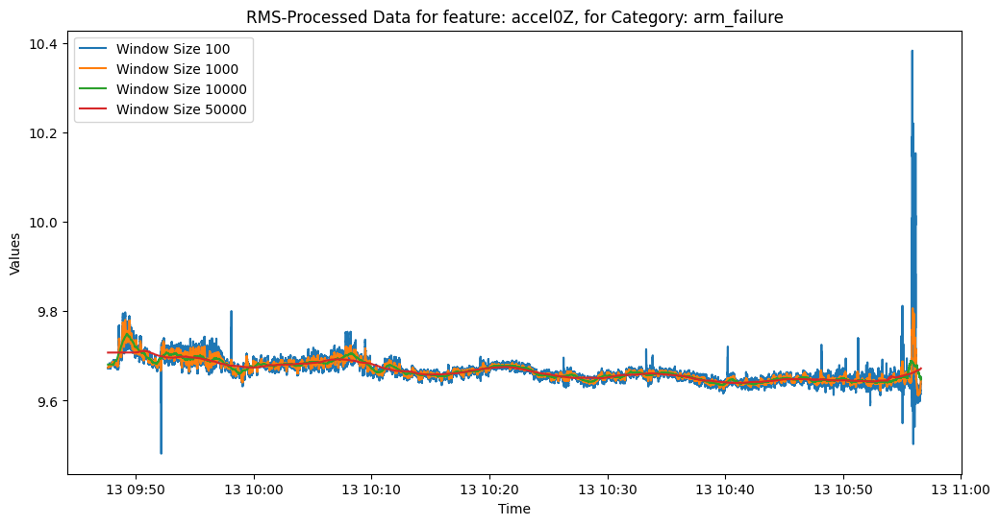

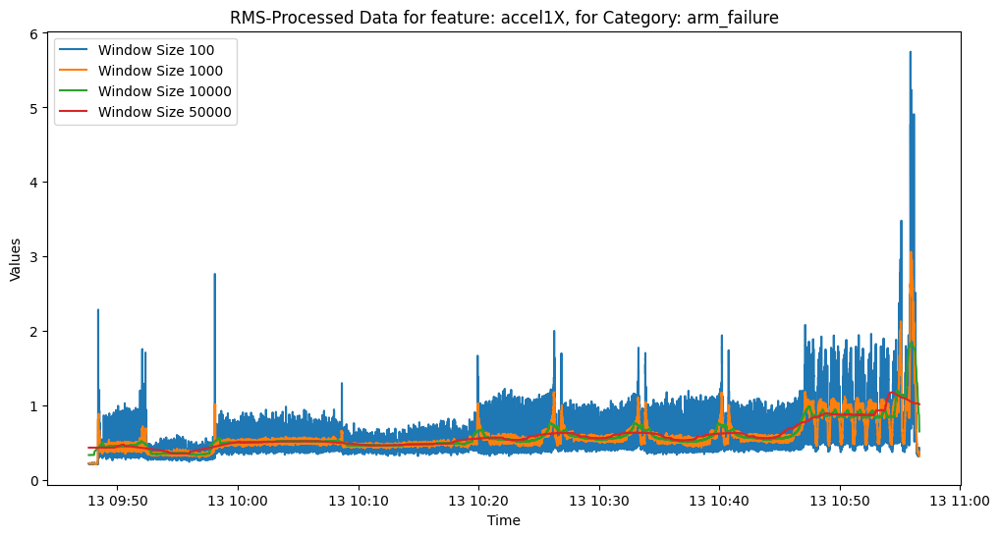

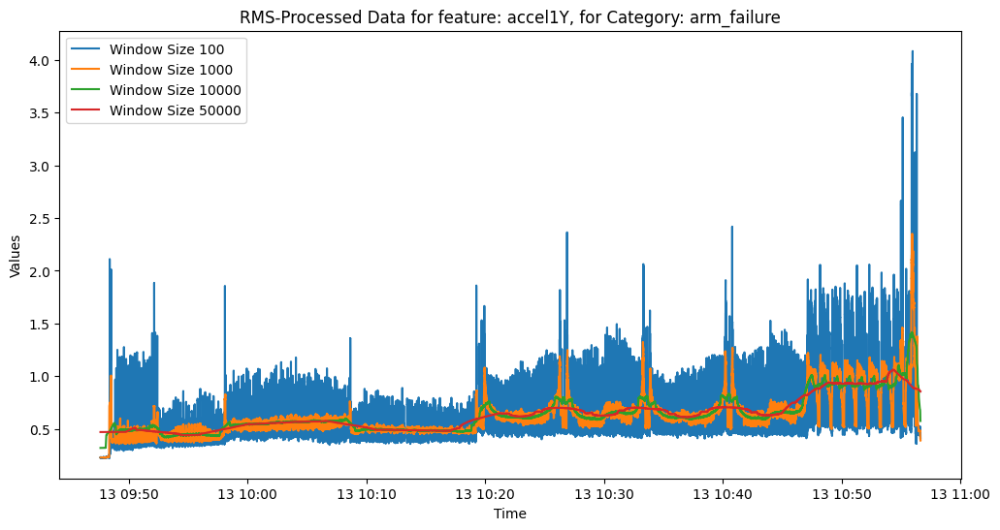

...

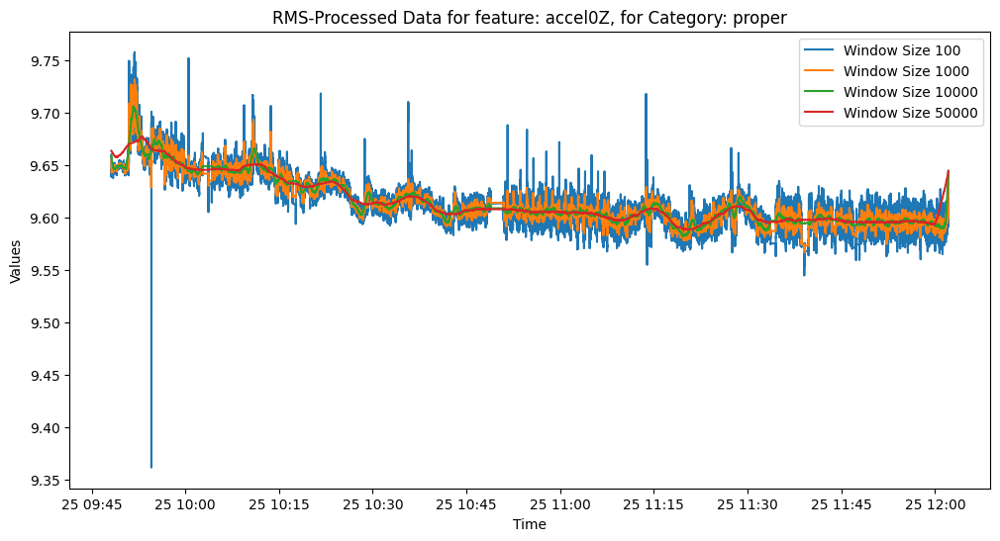

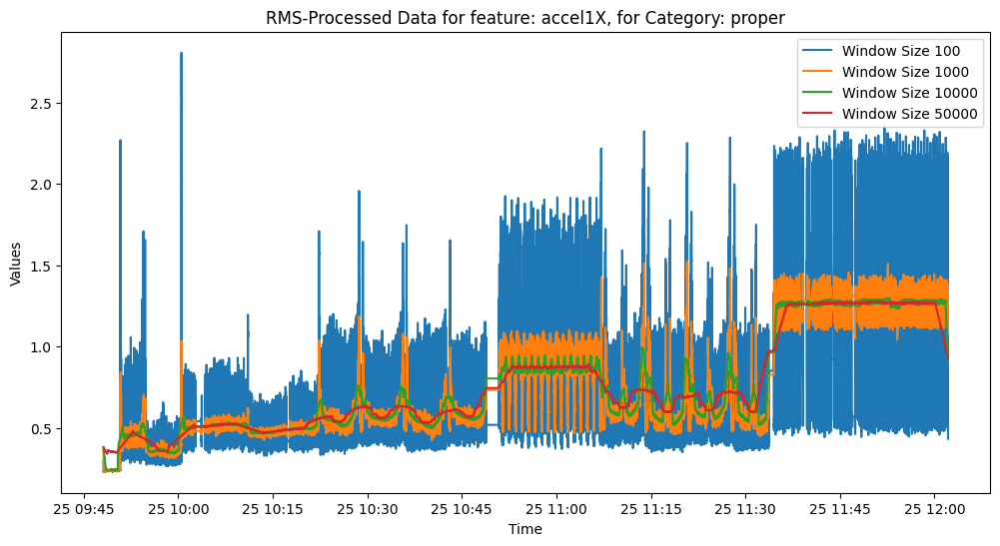

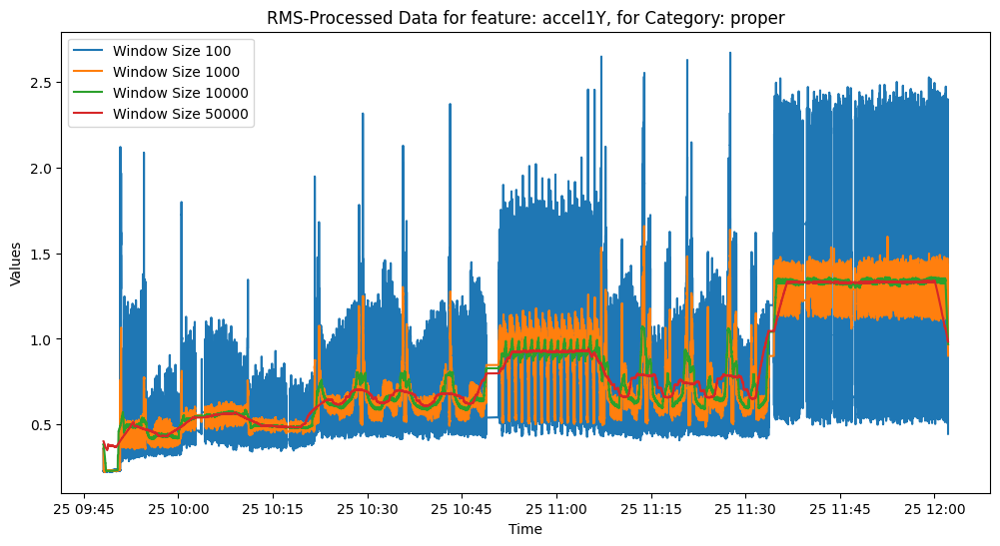

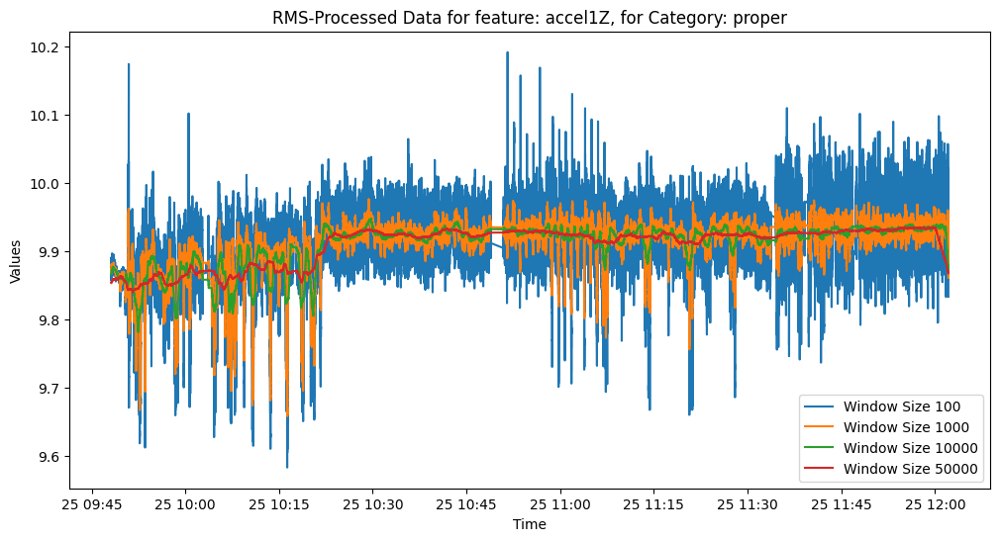

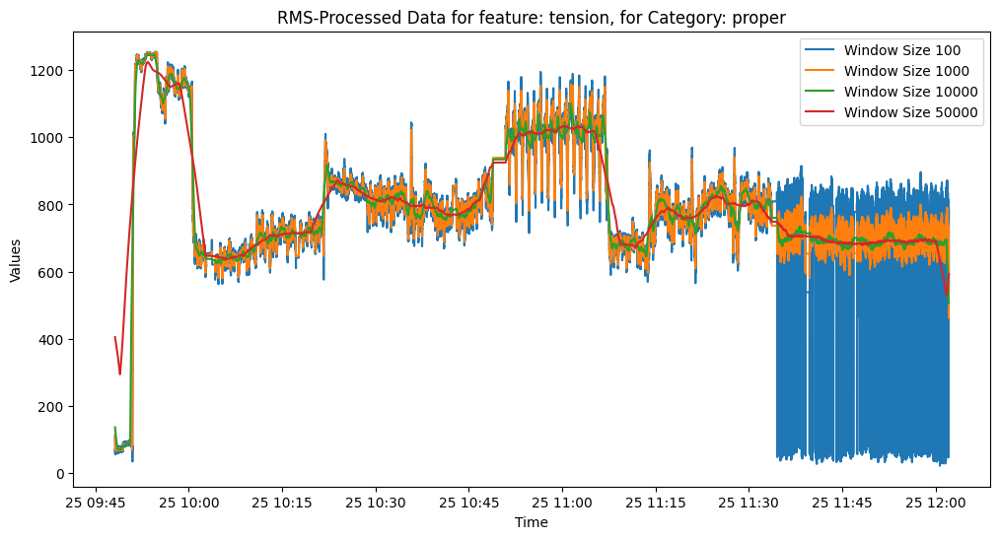

C:\Users\M.lotfi\anaconda3\envs\Myenv\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


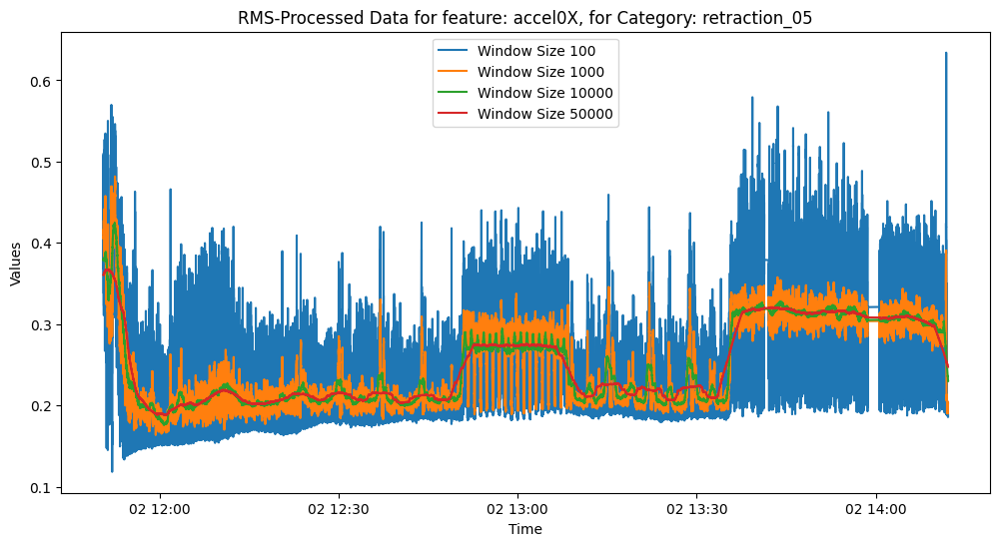

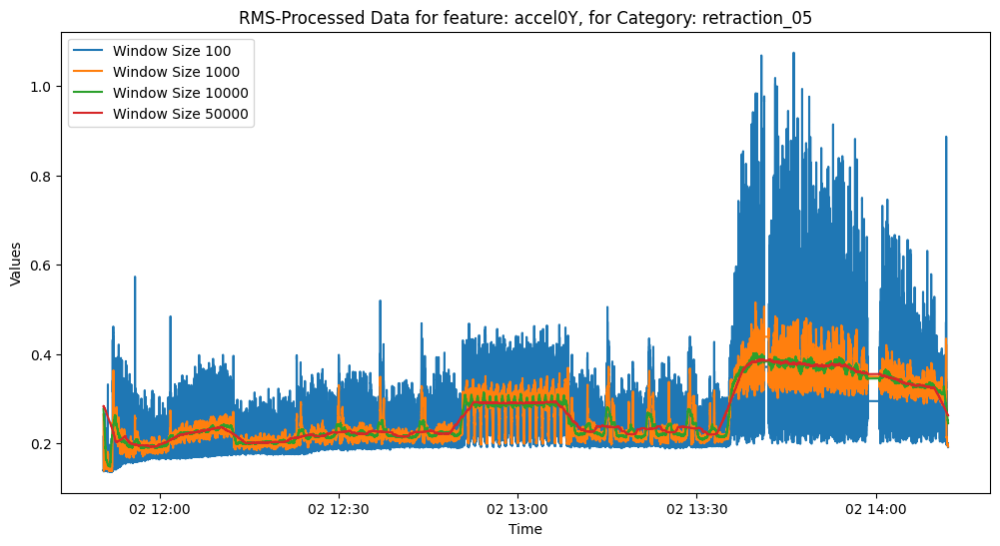

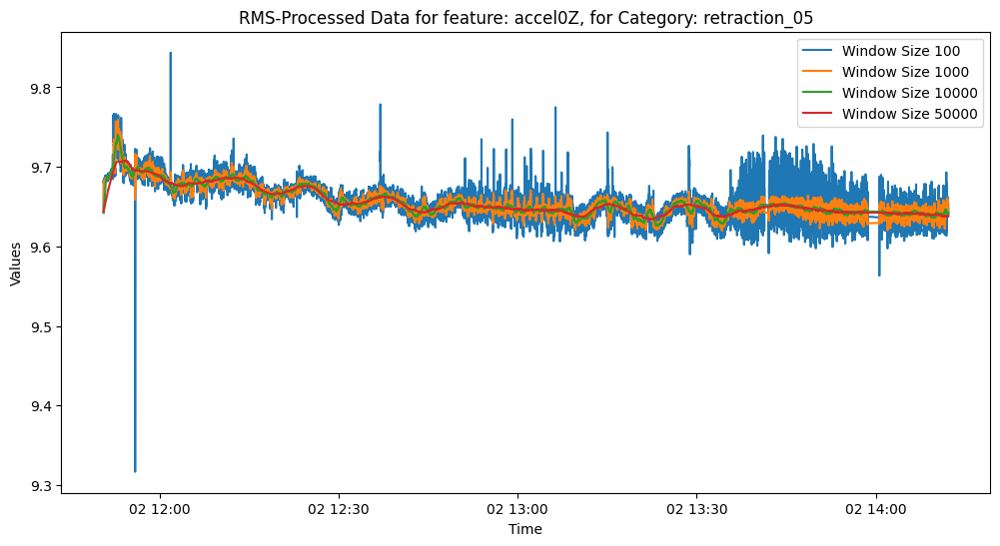

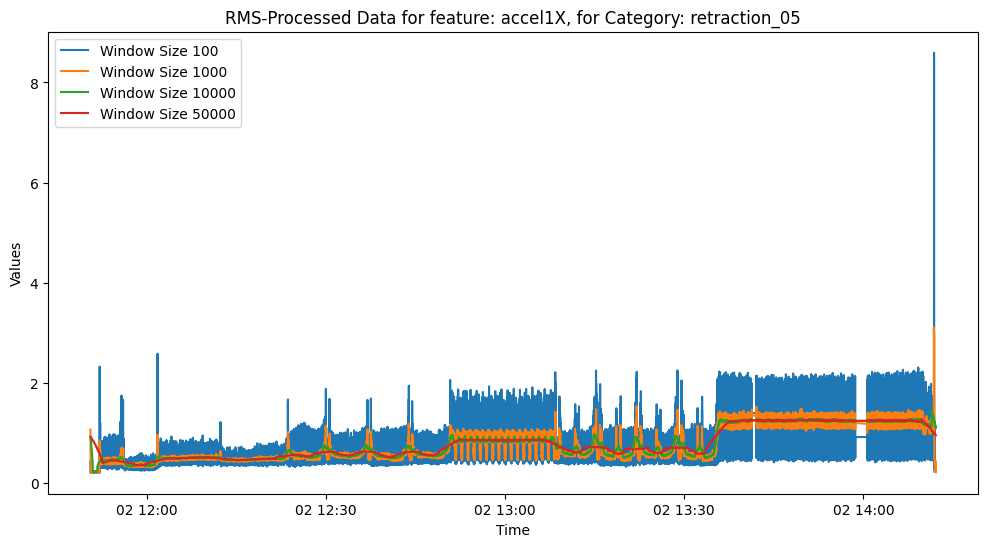

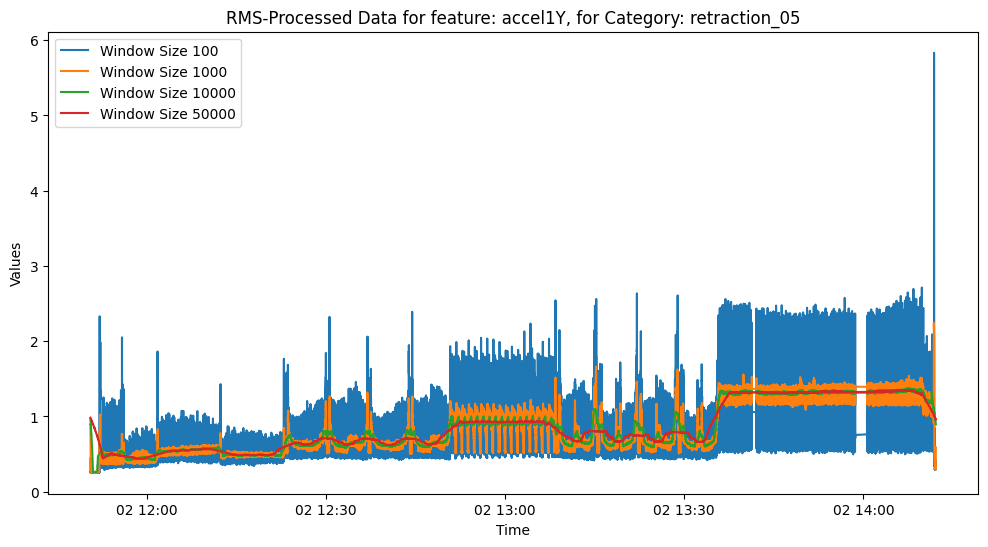

...

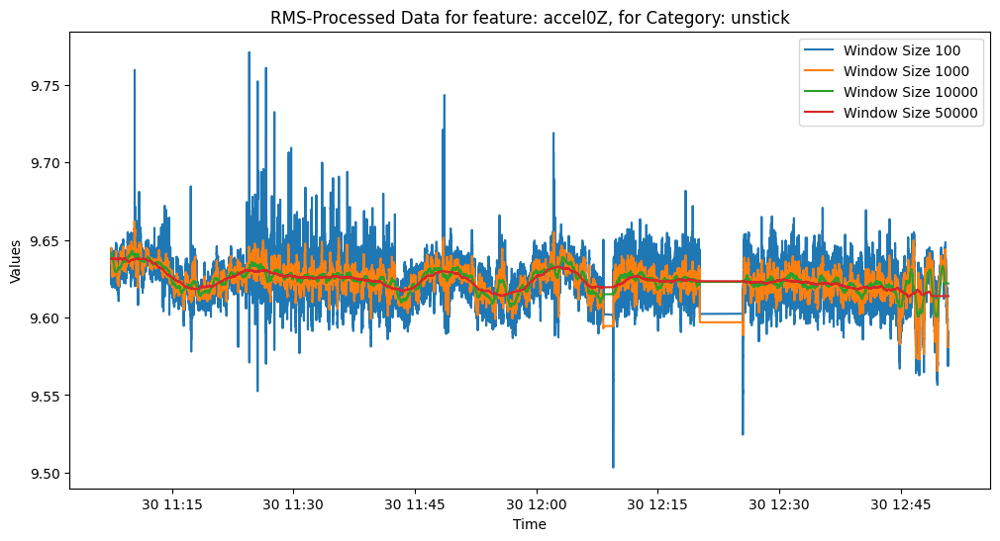

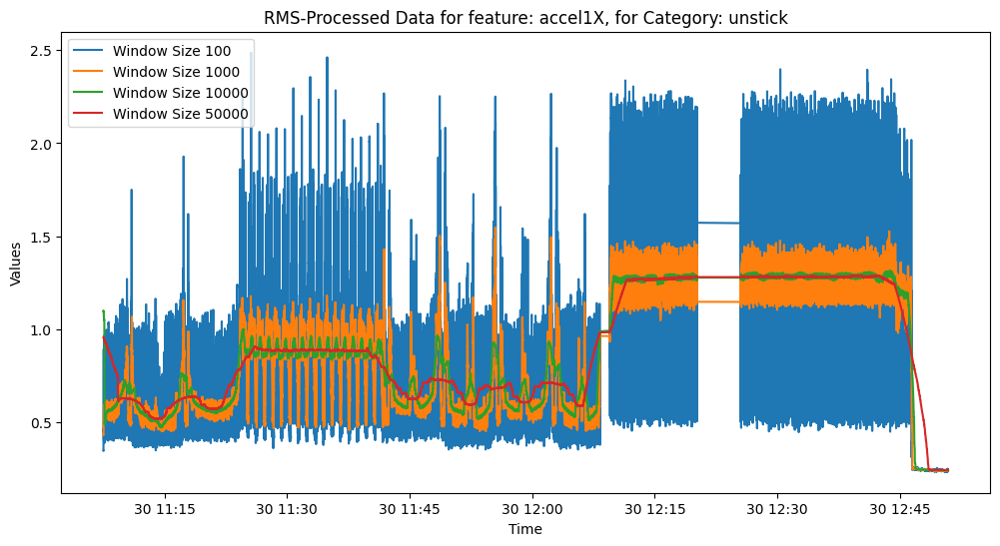

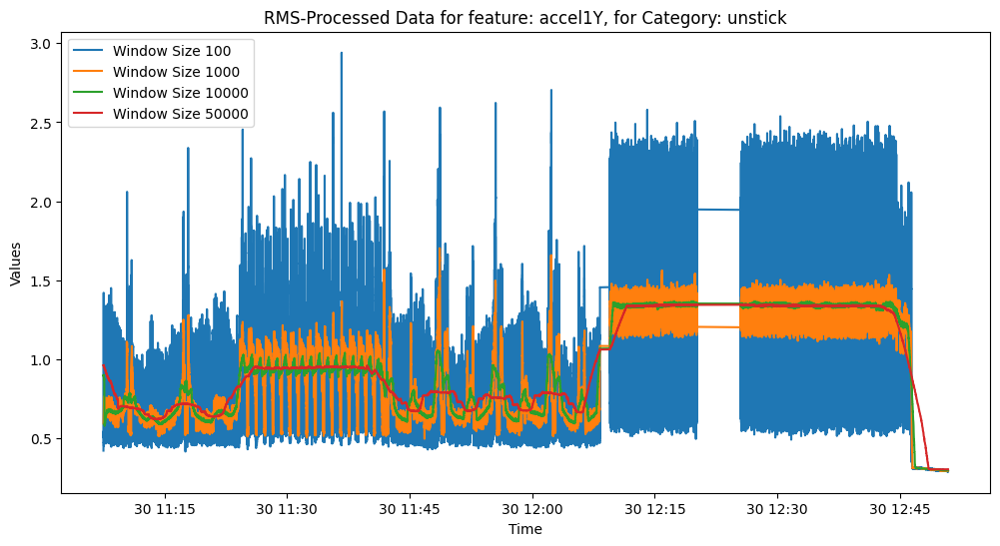

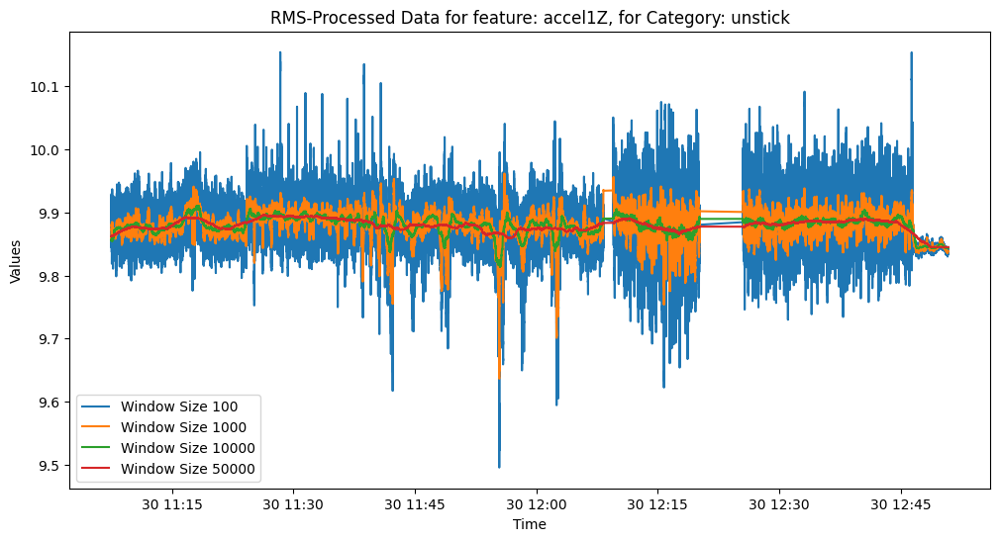

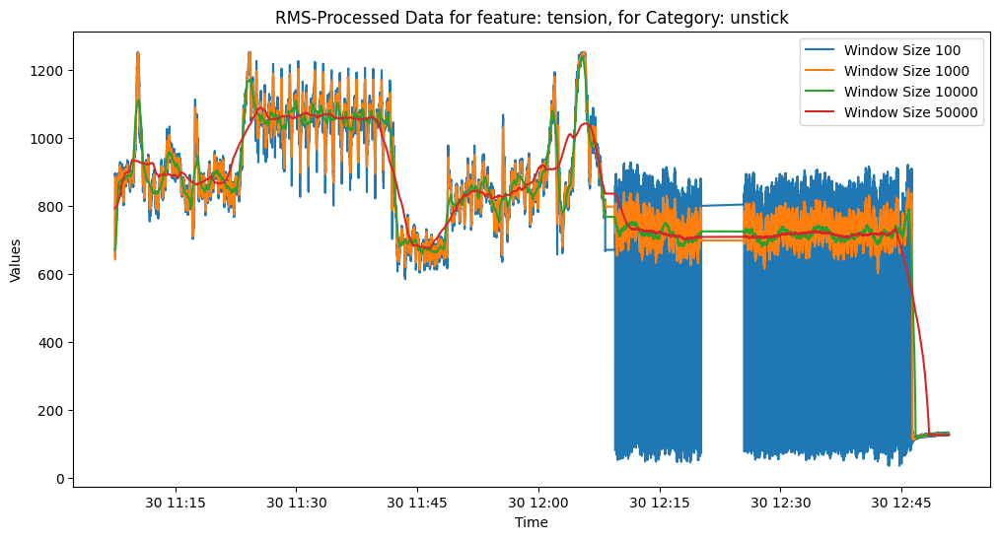

In [25]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to read data from text (CSV) files
def read_data(file_name):
    df = pd.read_csv(file_name, names=['data_id', 'accel0X', 'accel0Y', 'accel0Z', 'accel1X', 'accel1Y', 'accel1Z', 'tension', 'timestamp'], dtype=str)
    df['time'] = pd.to_datetime(df['timestamp'], unit='ms')
    df[['accel0X', 'accel0Y', 'accel0Z', 'accel1X', 'accel1Y', 'accel1Z', 'tension']] = df[['accel0X', 'accel0Y', 'accel0Z', 'accel1X', 'accel1Y', 'accel1Z', 'tension']].apply(pd.to_numeric, errors='coerce')
    df['tension'] = 0.650 * (df['tension'] - 2166)
    return df

def window_rms(a, window_size):
    a2 = np.power(a, 2)
    window = np.ones(window_size) / float(window_size)
    rms = np.sqrt(np.convolve(a2, window, 'valid'))
    pad_length = len(a) - len(rms)
    return np.pad(rms, (pad_length // 2, pad_length - pad_length // 2), 'edge')

def apply_window_rms(df, features, window_size):
    df_rms = df.copy()
    for feature in features:
        df_rms[feature] = window_rms(df[feature].values, window_size)
    return df_rms

# Assuming the rest of your code remains the same

base_directory = r'C:\MyFiles\AI\UNI\ML-DP-AI\Project\dataset\WithBase'
all_data = process_and_label_data(base_directory)
all_data = all_data.fillna(0)
features = ['accel0X', 'accel0Y', 'accel0Z', 'accel1X', 'accel1Y', 'accel1Z', 'tension']
Raw_data = all_data.copy()

categories = ['arm_failure', 'bowden', 'plastic', 'proper', 'retraction_05', 'unstick']

RMS_data_100 = apply_window_rms(all_data, features, 100)
RMS_data_1000 = apply_window_rms(all_data, features, 1000)
RMS_data_10000 = apply_window_rms(all_data, features, 10000)
RMS_data_50000 = apply_window_rms(all_data, features, 50000)

for category in categories:
    category_data_raw = Raw_data[Raw_data['label'] == category]
    category_data_rms_100 = RMS_data_100[RMS_data_100['label'] == category]
    category_data_rms_1000 = RMS_data_1000[RMS_data_1000['label'] == category]
    category_data_rms_10000 = RMS_data_10000[RMS_data_10000['label'] == category]
    category_data_rms_50000 = RMS_data_50000[RMS_data_50000['label'] == category]
    for feature in features:
        plt.figure(figsize=(12, 6))
        plt.plot(category_data_rms_100['time'], category_data_rms_100[feature], label=f'Window Size 100')
        plt.plot(category_data_rms_1000['time'], category_data_rms_1000[feature], label=f'Window Size 1000')
        plt.plot(category_data_rms_10000['time'], category_data_rms_10000[feature], label=f'Window Size 10000')
        plt.plot(category_data_rms_50000['time'], category_data_rms_50000[feature], label=f'Window Size 50000')
        plt.xlabel('Time')
        plt.ylabel('Values')
        plt.title(f'RMS-Processed Data for feature: {feature}, for Category: {category}')
        plt.legend()
        plt.show()


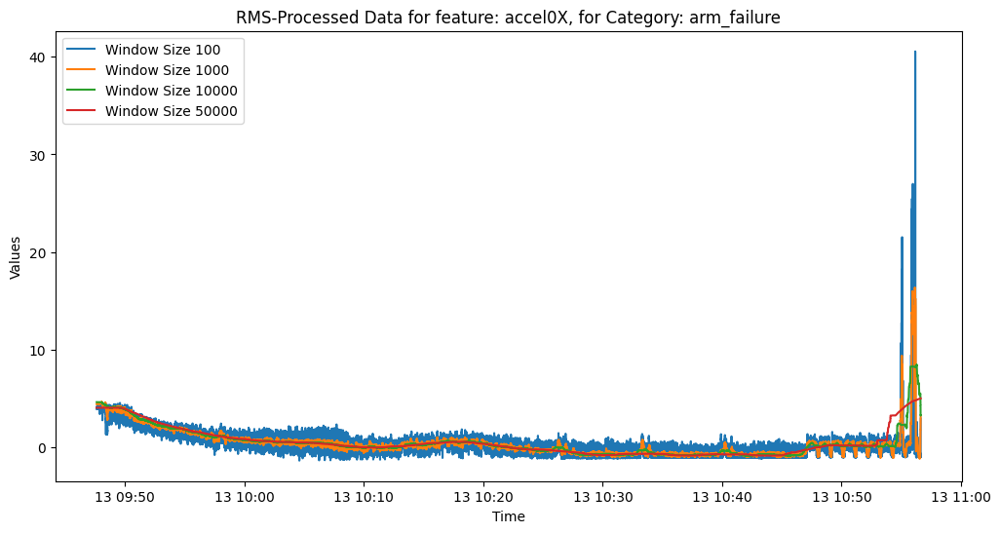

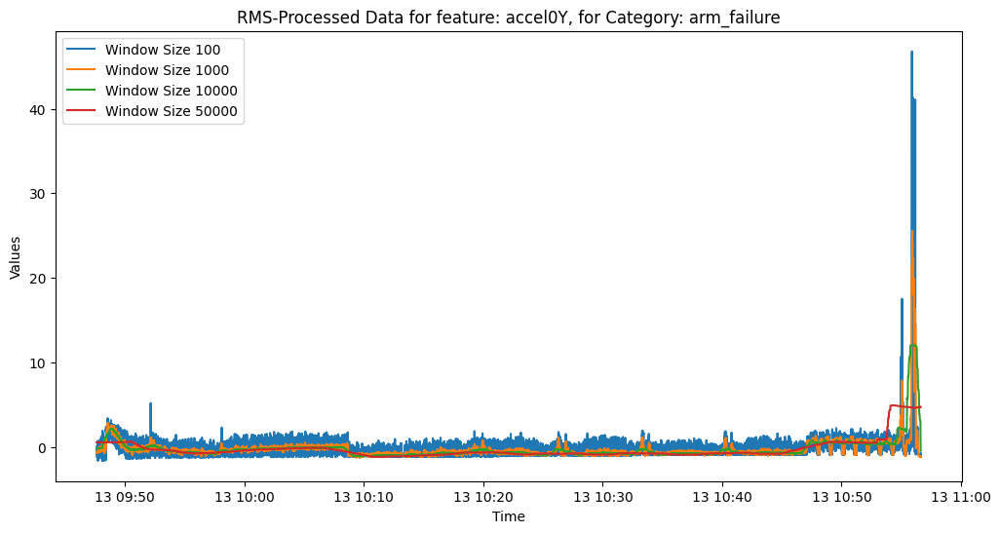

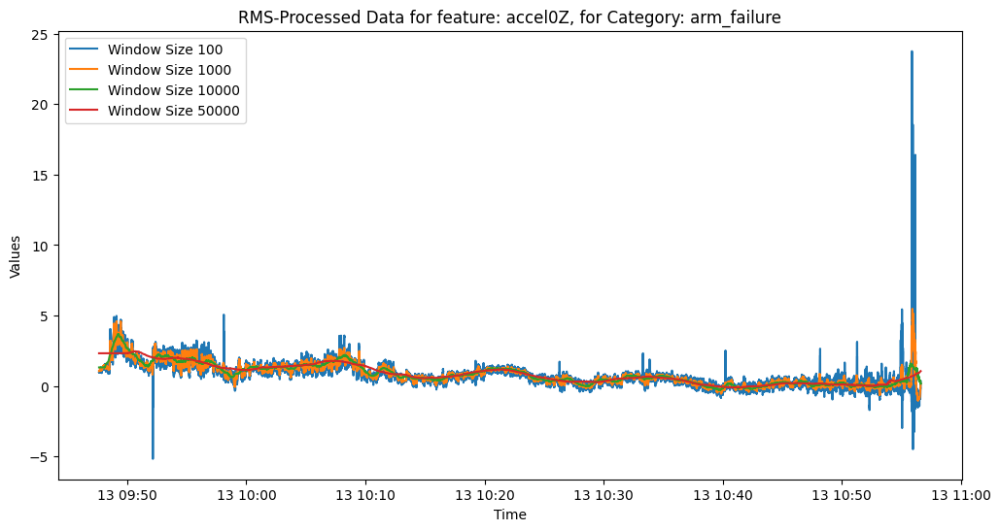

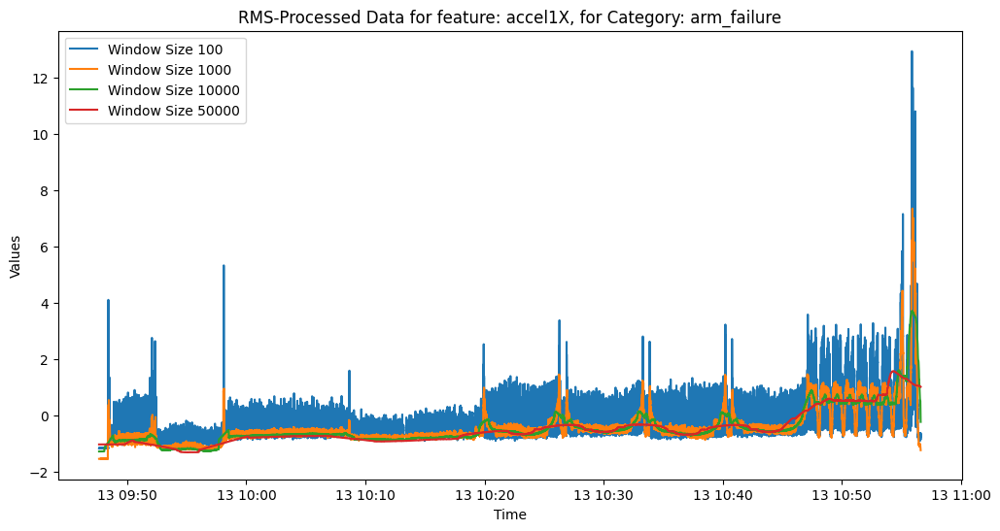

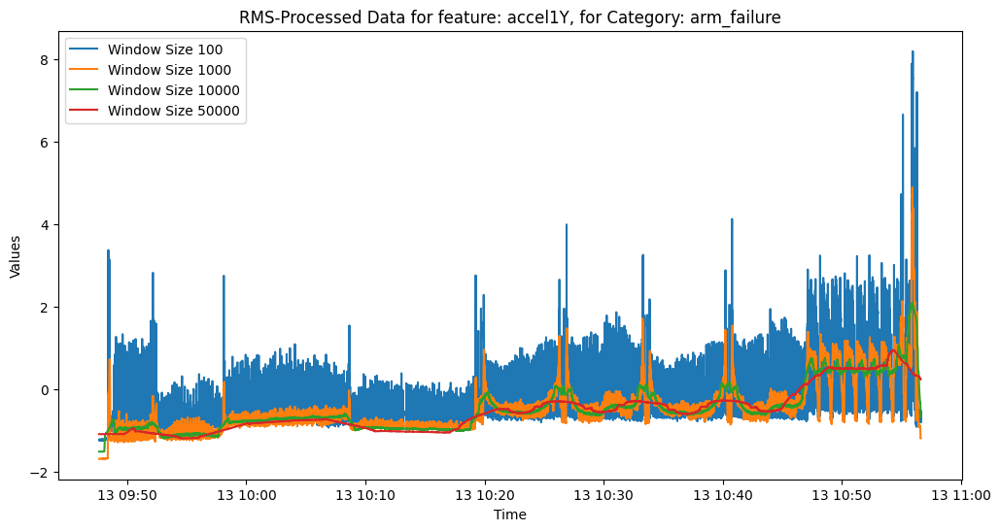

...

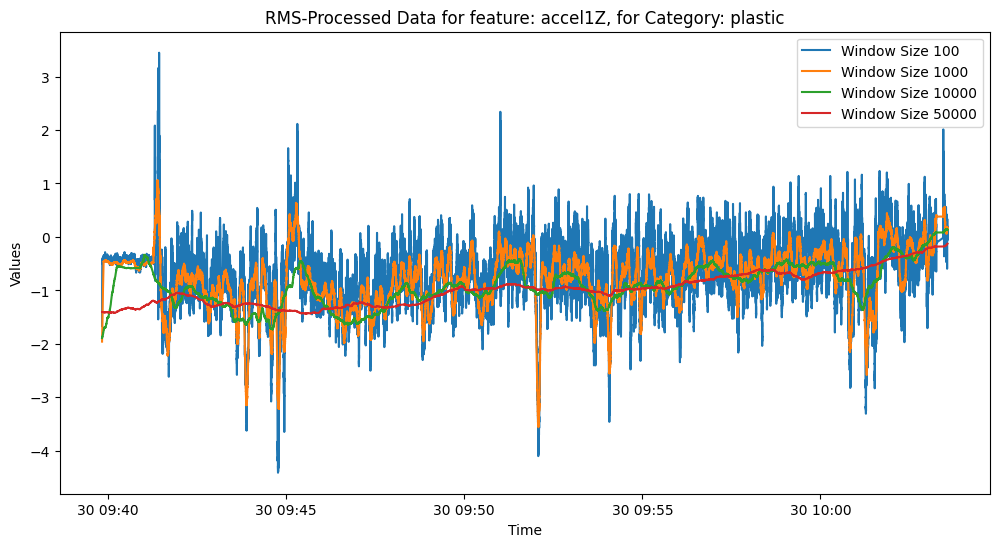

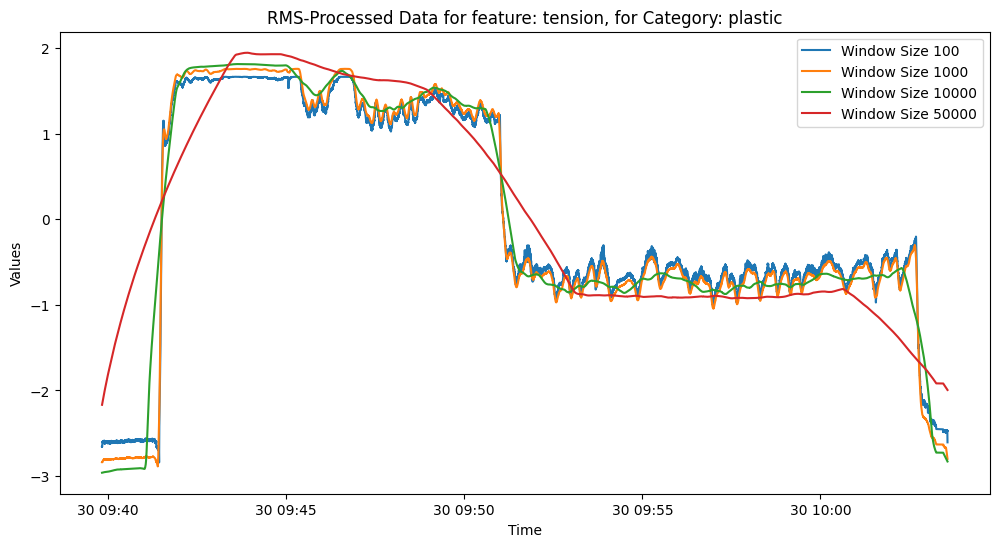

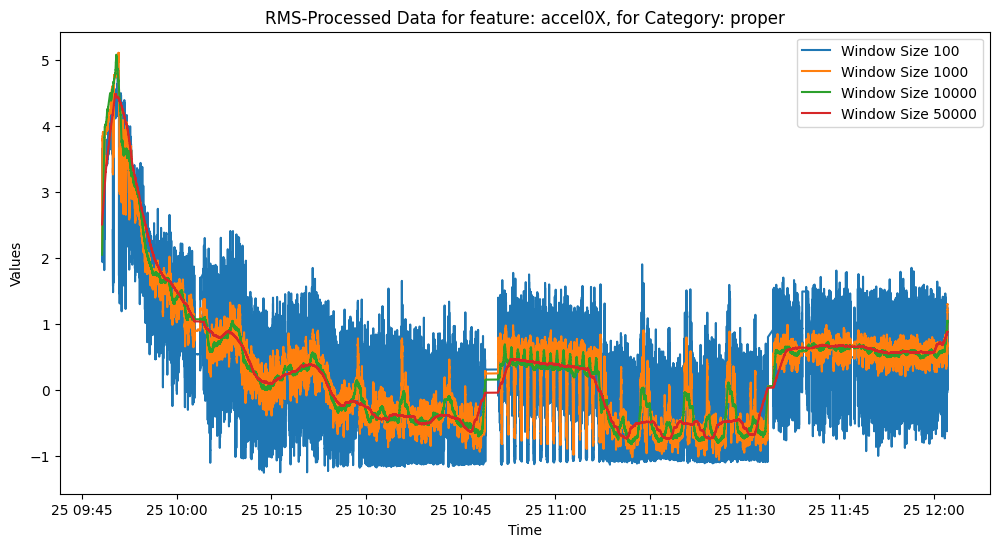

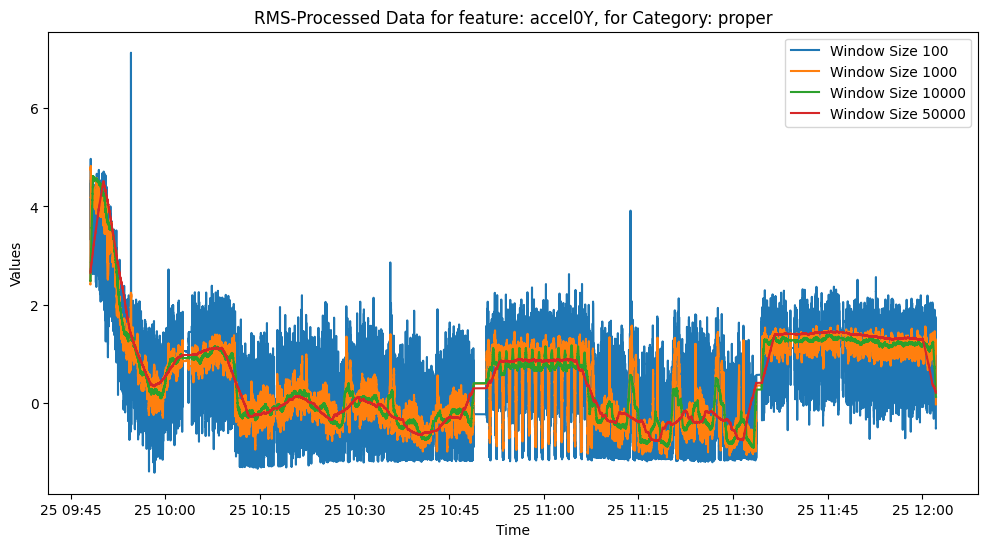

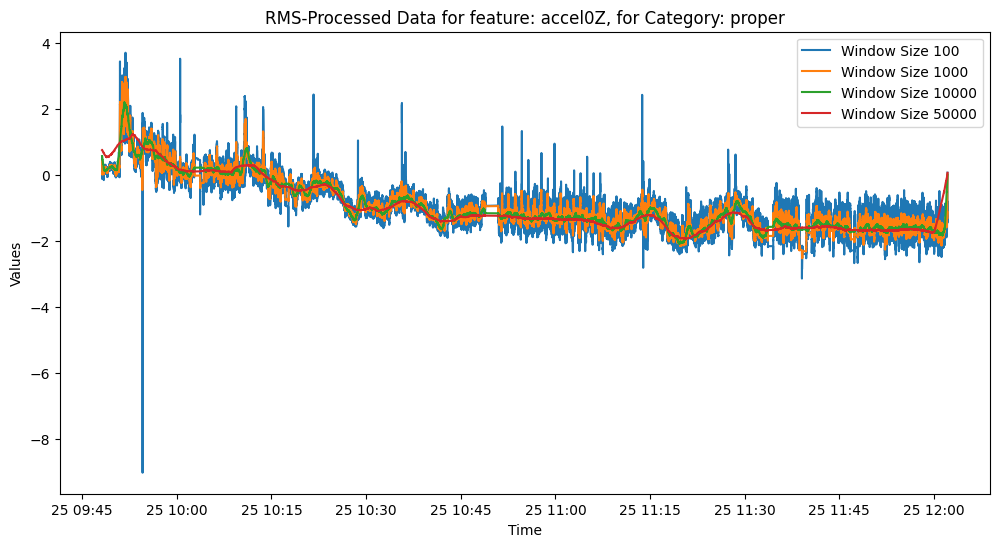

C:\Users\M.lotfi\anaconda3\envs\Myenv\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


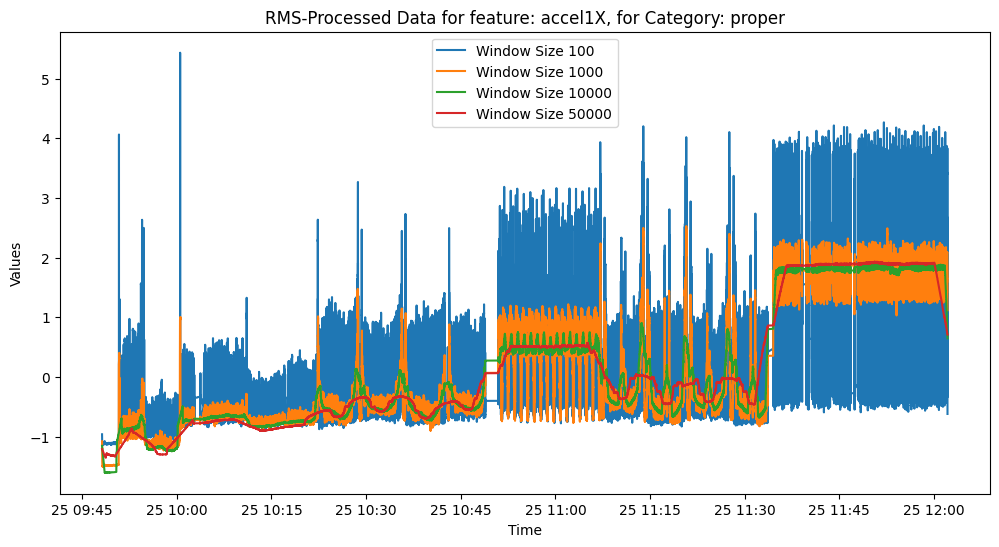

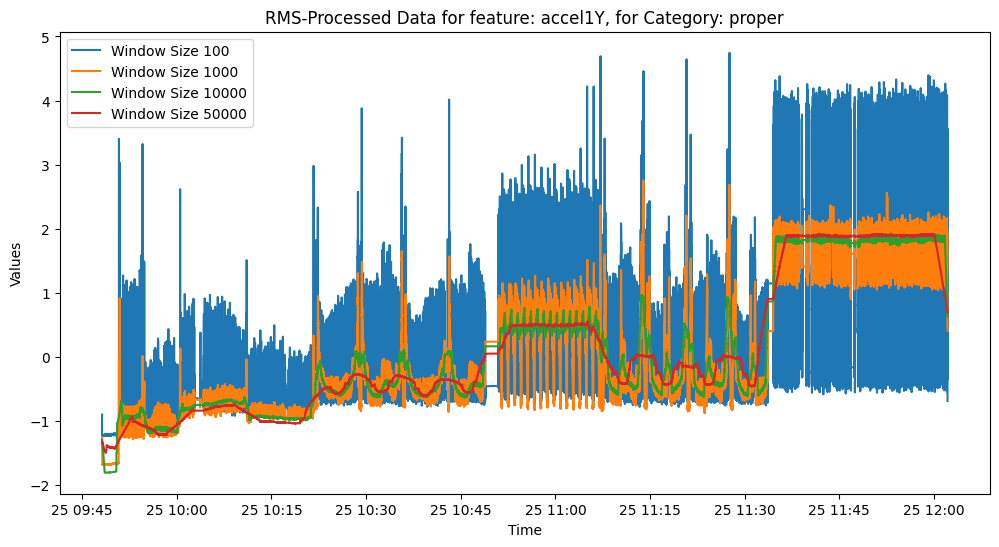

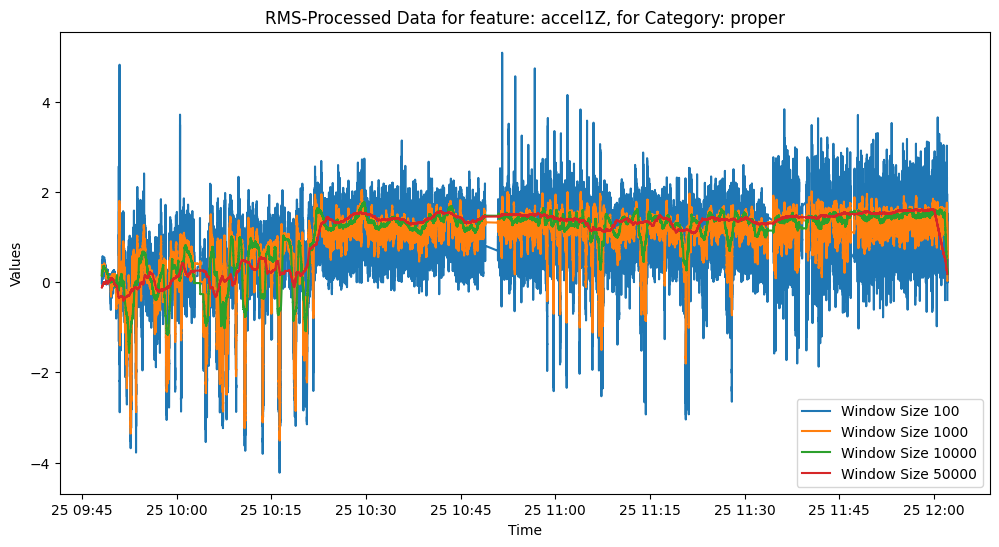

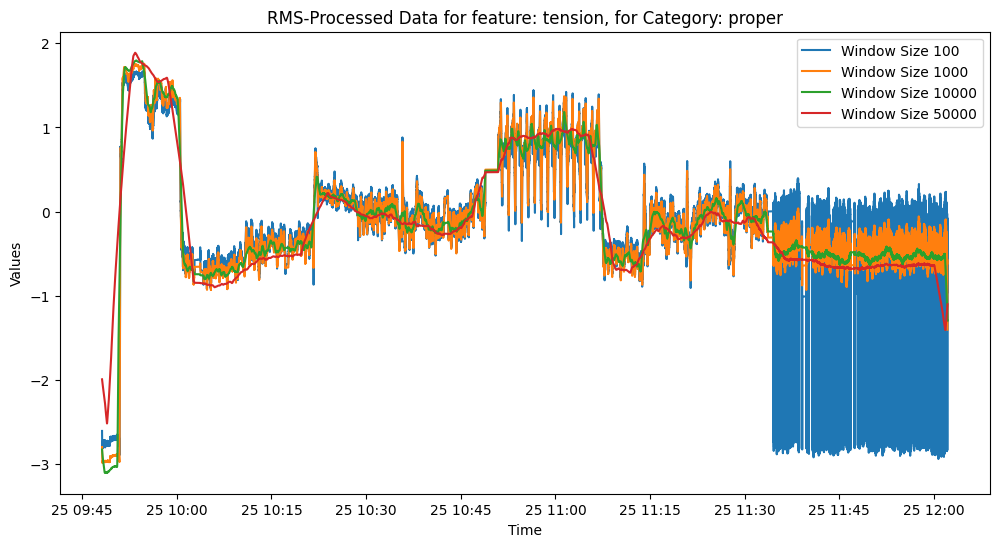

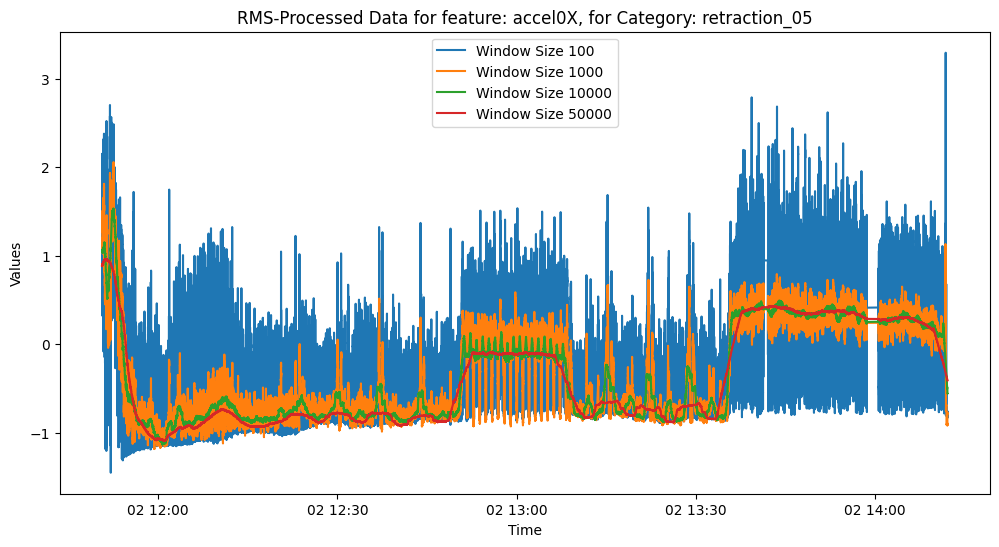

...

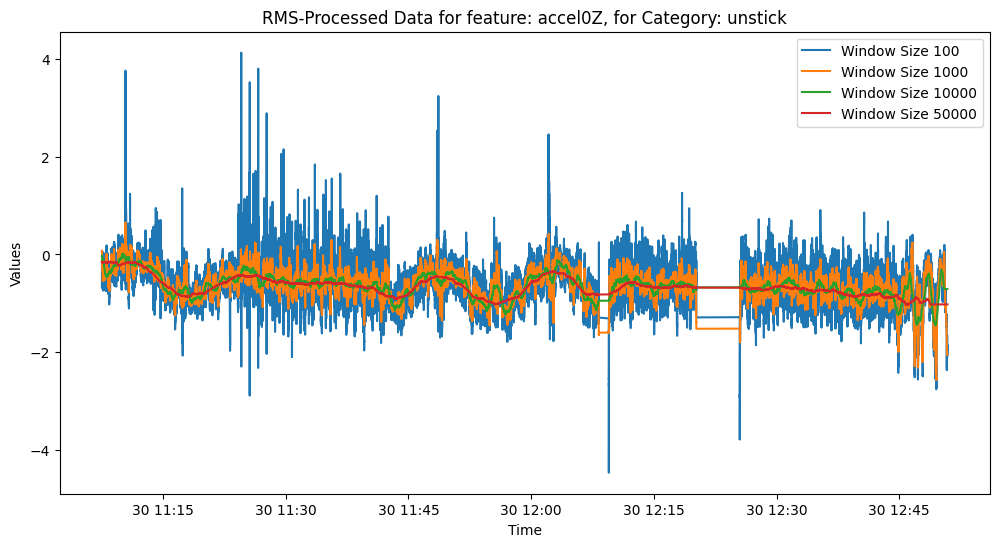

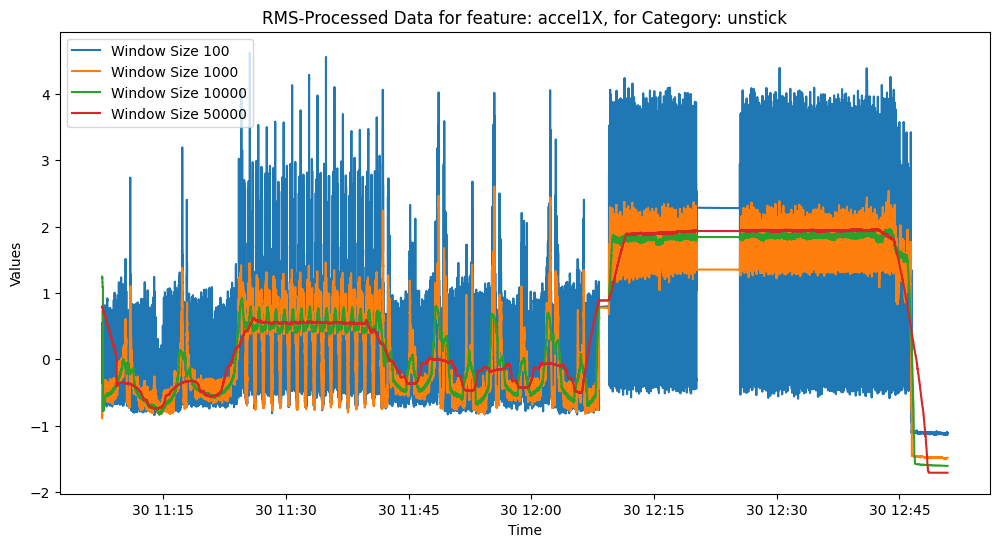

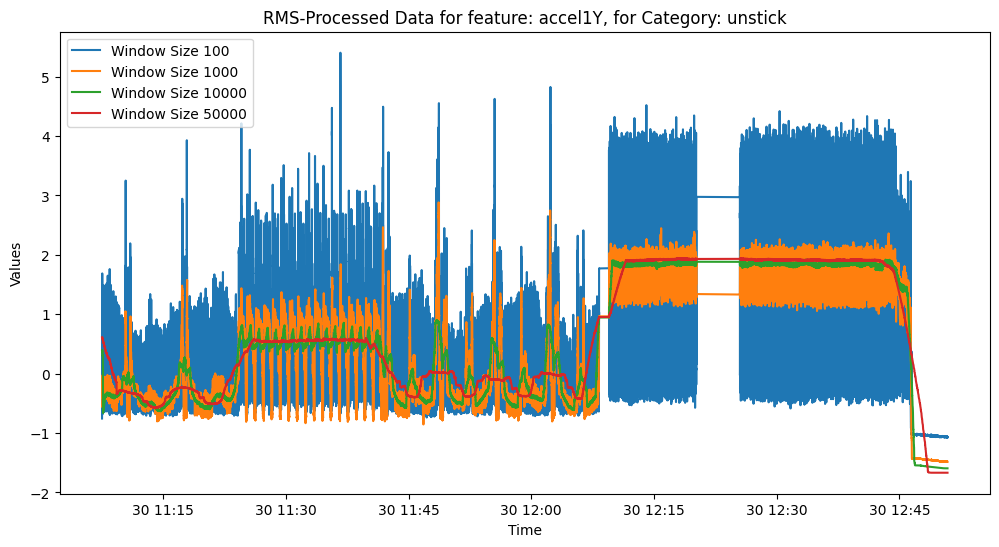

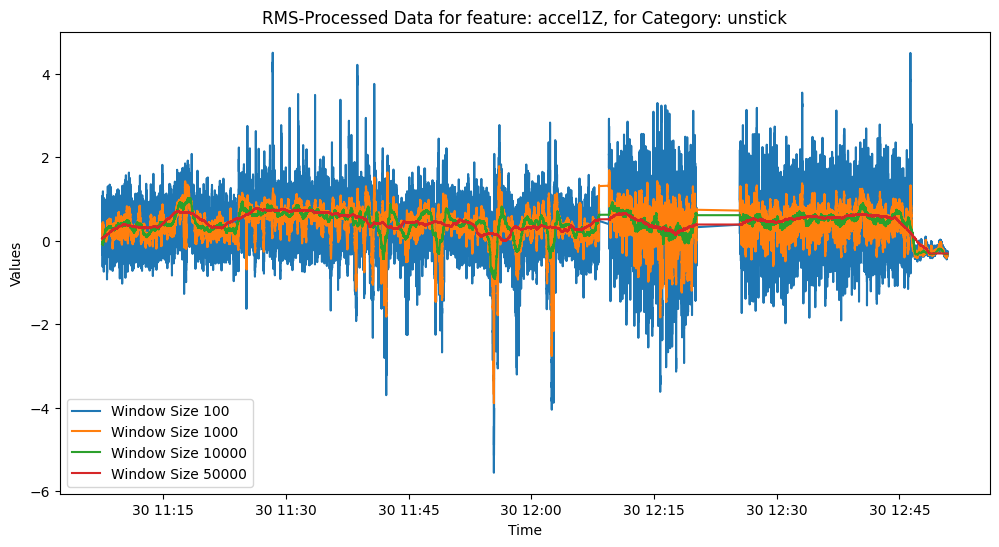

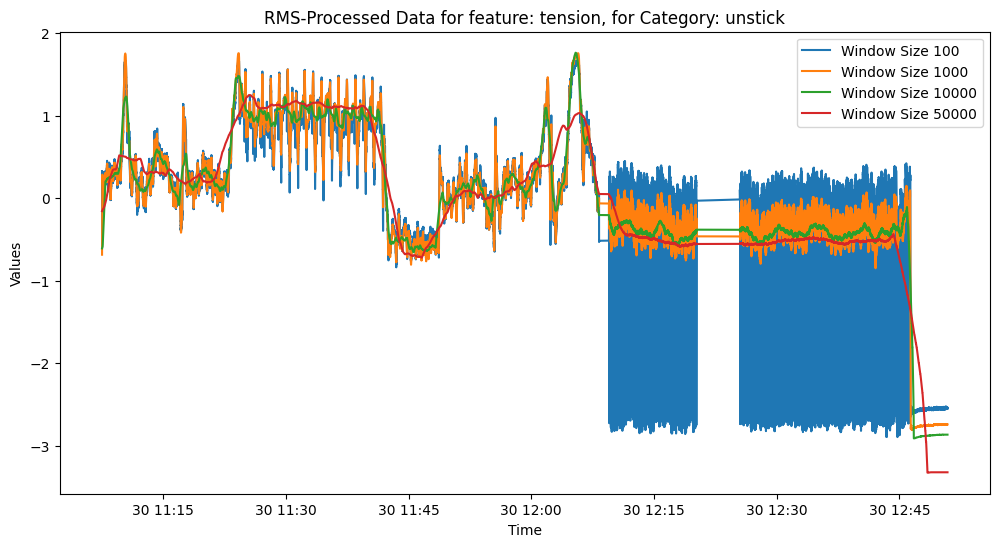

In [30]:
def zscore_normalize_data(df, columns):
    for column in columns:
        df[column] = df[column].astype(float)
        mean = df[column].mean()
        std = df[column].std()
        df[column] = (df[column] - mean) / std
    return df

all_data_100 = zscore_normalize_data(RMS_data_100, features)
all_data_1000 = zscore_normalize_data(RMS_data_1000, features)
all_data_10000 = zscore_normalize_data(RMS_data_10000, features)
all_data_50000 = zscore_normalize_data(RMS_data_50000, features)

for category in categories:
    category_all_data_100 = all_data_100[all_data_100['label'] == category]
    category_all_data_1000 = all_data_1000[all_data_1000['label'] == category]
    category_all_data_10000 = all_data_10000[all_data_10000['label'] == category]
    category_all_data_50000 = all_data_50000[all_data_50000['label'] == category]
    for feature in features:
        plt.figure(figsize=(12, 6))
        plt.plot(category_all_data_100['time'], category_all_data_100[feature], label=f'Window Size 100')
        plt.plot(category_all_data_1000['time'], category_all_data_1000[feature], label=f'Window Size 1000')
        plt.plot(category_all_data_10000['time'], category_all_data_10000[feature], label=f'Window Size 10000')
        plt.plot(category_all_data_50000['time'], category_all_data_50000[feature], label=f'Window Size 50000')
        plt.xlabel('Time')
        plt.ylabel('Values')
        plt.title(f'RMS-Processed Data for feature: {feature}, for Category: {category}')
        plt.legend()
        plt.show()

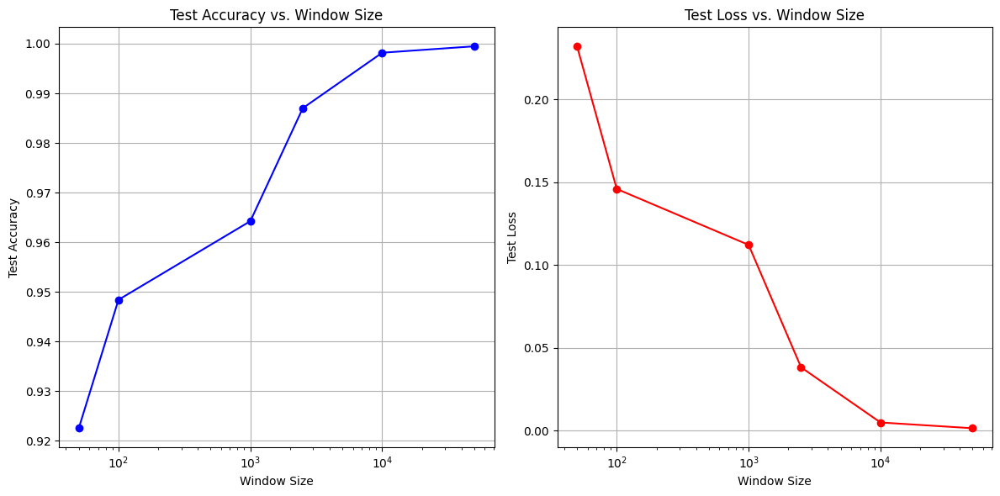

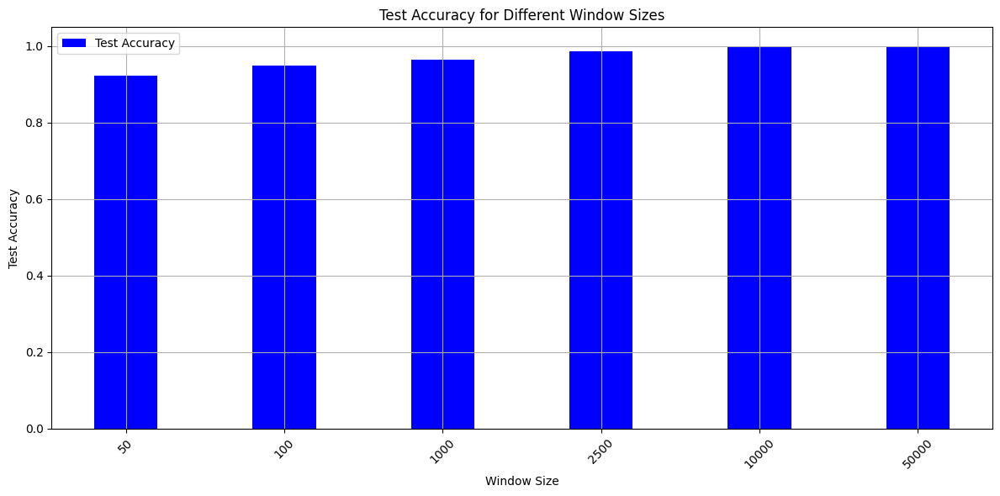

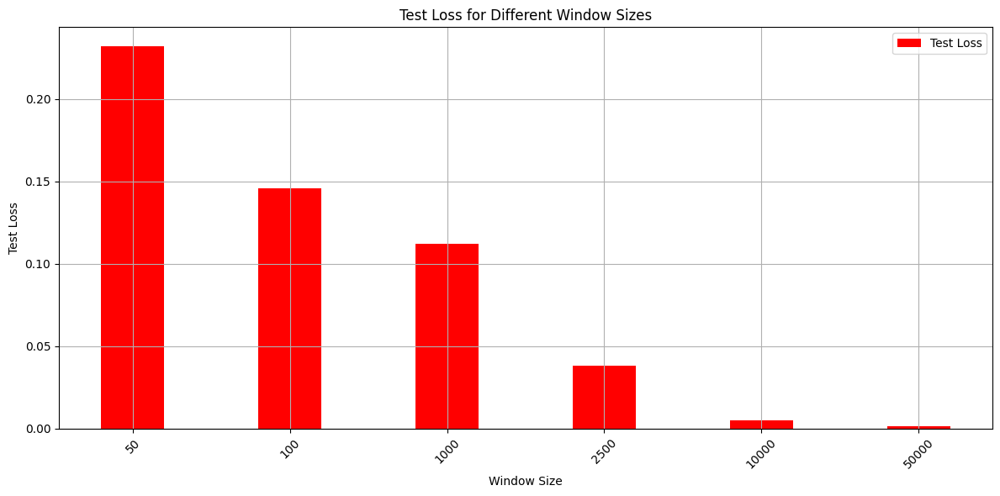

In [26]:
import matplotlib.pyplot as plt
import numpy as np

# Data for different window sizes
window_sizes = [50, 100, 1000, 2500, 10000, 50000]
test_accuracies = [0.9225175380706787, 0.9484027624130249, 0.9642454981803894, 0.98701411485672, 0.9981819987297058, 0.9994805455207825]
test_losses = [0.2320955097675323, 0.14598782360553741, 0.11223413795232773, 0.03831925988197327, 0.00505272438749671, 0.0015681246295571327]

# Plot Test Accuracy
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(window_sizes, test_accuracies, marker='o', linestyle='-', color='b')
plt.xlabel('Window Size')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy vs. Window Size')
plt.xscale('log')
plt.grid(True)

# Plot Test Loss
plt.subplot(1, 2, 2)
plt.plot(window_sizes, test_losses, marker='o', linestyle='-', color='r')
plt.xlabel('Window Size')
plt.ylabel('Test Loss')
plt.title('Test Loss vs. Window Size')
plt.xscale('log')
plt.grid(True)

plt.tight_layout()
plt.show()

# Bar chart for Test Accuracy
plt.figure(figsize=(12, 6))
bar_width = 0.4
index = np.arange(len(window_sizes))

plt.bar(index, test_accuracies, bar_width, label='Test Accuracy', color='b')
plt.xlabel('Window Size')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy for Different Window Sizes')
plt.xticks(index, window_sizes, rotation=45)
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

# Bar chart for Test Loss
plt.figure(figsize=(12, 6))

plt.bar(index, test_losses, bar_width, label='Test Loss', color='r')
plt.xlabel('Window Size')
plt.ylabel('Test Loss')
plt.title('Test Loss for Different Window Sizes')
plt.xticks(index, window_sizes, rotation=45)
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()
